FINANCIAL ANALYTICS


PROJECT TITLE: Analyzing the Impact of Seasonal Income Fluctua􀆟ons on Household Financial Stability
in Rural Africa

In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import ydata_profiling as pp  
import warnings
%matplotlib inline
warnings.filterwarnings(category=FutureWarning, action= "ignore")

In [109]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, classification_report
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [5]:
#importing dataset
financial= pd.read_csv(r"C:\Users\HP\OneDrive\Desktop\Dataverse Africa Internship\Project_Household_Financial_Stability_Uganda-1a.csv")
financial

,Household_ID,Location,Family_Size,Education_Level,Employment_Type,Has_Savings_Account,Uses_Savings_Group,Uses_Mobile_Money,Distance_to_Bank_km,Borrowing,Selling_Assets,Reducing_Spending,Financial_Stress_Score
0,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,0,0,38.17
1,2,Mbarara,8,Secondary,Livestock Rearing,0,1,0,19.10,0,0,1,40.89
2,3,Jinja,9,NaN,Subsistence Farming,0,0,0,33.68,0,1,0,30.64
3,4,Fort Portal,5,Secondary,Livestock Rearing,1,1,1,22.11,0,0,0,41.67
4,5,Mbale,4,Tertiary,Subsistence Farming,1,0,0,39.52,0,0,1,52.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,Hoima,3,Secondary,Livestock Rearing,1,1,1,31.14,1,0,0,32.61
996,997,Hoima,7,Primary,Livestock Rearing,1,1,0,18.59,0,1,0,32.54
997,998,Jinja,8,Primary,Subsistence Farming,1,0,0,39.58,0,0,0,52.12
998,999,Gulu,3,Primary,Small Business,0,1,0,40.03,0,0,1,46.31


In [6]:
seasonal = pd.read_csv(r"C:\Users\HP\OneDrive\Desktop\Dataverse Africa Internship\Project_Household_Seasonal_Data_Uganda-1b (1).csv")
seasonal

,Household_ID,Month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income
0,1,1,41479,10218,22426,33593,6718,10077,16796,74123
1,1,2,71975,39159,64340,67307,13461,20192,33653,175474
2,1,3,51500,10150,38033,31871,6374,9561,15935,99683
3,1,4,54994,26173,33915,57518,11503,17255,28759,115082
4,1,5,15425,23218,22095,30281,6056,9084,15140,60738
...,...,...,...,...,...,...,...,...,...,...
23995,1000,20,59281,36838,42606,79556,15911,23866,39778,138725
23996,1000,21,68174,39009,22251,47138,9427,14141,23569,129434
23997,1000,22,114592,19940,23729,57099,11419,17129,28549,158261
23998,1000,23,42176,14022,18619,35880,7176,10764,17940,74817


In [7]:
seasonal1=pd.read_csv(r"C:\Users\HP\OneDrive\Desktop\Dataverse Africa Internship\Household_Seasonal_Data_Uganda.csv")
seasonal1

,Household_ID,Month,Year_month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income,Total_Expense,Income_After_Expense,Wealth_Status
0,1,1,Jan-23,41479,10218,22426,33593,6718,10077,16796,74123,67184,6939,Low Income
1,1,2,Feb-23,71975,39159,64340,67307,13461,20192,33653,175474,134613,40861,Middle Income
2,1,3,Mar-23,51500,10150,38033,31871,6374,9561,15935,99683,63741,35942,Middle Income
3,1,4,Apr-23,54994,26173,33915,57518,11503,17255,28759,115082,115035,47,Low Income
4,1,5,May-23,15425,23218,22095,30281,6056,9084,15140,60738,60561,177,Low Income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23995,1000,20,Aug-24,59281,36838,42606,79556,15911,23866,39778,138725,159111,-20386,Bankrupt
23996,1000,21,Sep-24,68174,39009,22251,47138,9427,14141,23569,129434,94275,35159,Middle Income
23997,1000,22,Oct-24,114592,19940,23729,57099,11419,17129,28549,158261,114196,44065,Middle Income
23998,1000,23,Nov-24,42176,14022,18619,35880,7176,10764,17940,74817,71760,3057,Low Income


In [8]:
financial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Household_ID            1000 non-null   int64  
 1   Location                1000 non-null   object 
 2   Family_Size             1000 non-null   int64  
 3   Education_Level         904 non-null    object 
 4   Employment_Type         1000 non-null   object 
 5   Has_Savings_Account     1000 non-null   int64  
 6   Uses_Savings_Group      1000 non-null   int64  
 7   Uses_Mobile_Money       1000 non-null   int64  
 8   Distance_to_Bank_km     1000 non-null   float64
 9   Borrowing               1000 non-null   int64  
 10  Selling_Assets          1000 non-null   int64  
 11  Reducing_Spending       1000 non-null   int64  
 12  Financial_Stress_Score  1000 non-null   float64
dtypes: float64(2), int64(8), object(3)
memory usage: 101.7+ KB


In [9]:
financial.describe()

,Household_ID,Family_Size,Has_Savings_Account,Uses_Savings_Group,Uses_Mobile_Money,Distance_to_Bank_km,Borrowing,Selling_Assets,Reducing_Spending,Financial_Stress_Score
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,500.500000,5.425000,0.601000,0.521000,0.286000,25.607560,0.283000,0.199000,0.485000,39.827260
std,288.819436,2.311648,0.489938,0.499809,0.452115,14.342114,0.450682,0.399448,0.500025,7.179018
min,1.000000,2.000000,0.000000,0.000000,0.000000,1.020000,0.000000,0.000000,0.000000,14.960000
25%,250.750000,3.000000,0.000000,0.000000,0.000000,12.950000,0.000000,0.000000,0.000000,35.565000
50%,500.500000,5.000000,1.000000,1.000000,0.000000,25.870000,0.000000,0.000000,0.000000,40.820000
75%,750.250000,7.000000,1.000000,1.000000,1.000000,37.935000,1.000000,0.000000,1.000000,45.050000
max,1000.000000,9.000000,1.000000,1.000000,1.000000,49.900000,1.000000,1.000000,1.000000,57.180000


In [10]:
financial.dtypes

Household_ID                int64
Location                   object
Family_Size                 int64
Education_Level            object
Employment_Type            object
Has_Savings_Account         int64
Uses_Savings_Group          int64
Uses_Mobile_Money           int64
Distance_to_Bank_km       float64
Borrowing                   int64
Selling_Assets              int64
Reducing_Spending           int64
Financial_Stress_Score    float64
dtype: object

In [11]:
financial.columns

Index(['Household_ID', 'Location', 'Family_Size', 'Education_Level',
       'Employment_Type', 'Has_Savings_Account', 'Uses_Savings_Group',
       'Uses_Mobile_Money', 'Distance_to_Bank_km', 'Borrowing',
       'Selling_Assets', 'Reducing_Spending', 'Financial_Stress_Score'],
      dtype='object')

In [12]:
#Checking for null values
financial.isna().sum()

Household_ID               0
Location                   0
Family_Size                0
Education_Level           96
Employment_Type            0
Has_Savings_Account        0
Uses_Savings_Group         0
Uses_Mobile_Money          0
Distance_to_Bank_km        0
Borrowing                  0
Selling_Assets             0
Reducing_Spending          0
Financial_Stress_Score     0
dtype: int64

Our dataset contains 96 missing values in the Education_level column. We should ask the stakeholders how to handle them.

In [13]:
#Handling missing values
financial.fillna("No Education", inplace=True)

In [14]:
financial.isna().sum()

Household_ID              0
Location                  0
Family_Size               0
Education_Level           0
Employment_Type           0
Has_Savings_Account       0
Uses_Savings_Group        0
Uses_Mobile_Money         0
Distance_to_Bank_km       0
Borrowing                 0
Selling_Assets            0
Reducing_Spending         0
Financial_Stress_Score    0
dtype: int64

In [15]:
#Profile Report
pp.ProfileReport(financial)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
#Checking for duplicates
financial.duplicated().sum()

0

In [17]:
#Ensure there are no accidental spaces in column names
financial.columns= financial.columns.str.strip()

In [18]:
financial.head()

,Household_ID,Location,Family_Size,Education_Level,Employment_Type,Has_Savings_Account,Uses_Savings_Group,Uses_Mobile_Money,Distance_to_Bank_km,Borrowing,Selling_Assets,Reducing_Spending,Financial_Stress_Score
0,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,0,0,38.17
1,2,Mbarara,8,Secondary,Livestock Rearing,0,1,0,19.10,0,0,1,40.89
2,3,Jinja,9,No Education,Subsistence Farming,0,0,0,33.68,0,1,0,30.64
3,4,Fort Portal,5,Secondary,Livestock Rearing,1,1,1,22.11,0,0,0,41.67
4,5,Mbale,4,Tertiary,Subsistence Farming,1,0,0,39.52,0,0,1,52.50


In [19]:
# Check for data entry error or inconsistencies
print("Unique Location:\n", financial["Location"].unique(), "\n")
print("Unique Family_Size:\n", financial["Family_Size"].unique(), "\n")
print("Unique Education_Level:\n", financial["Education_Level"].unique(), "\n")
print("Unique Employment_Type:\n", financial["Employment_Type"].unique(), "\n")
print("Unique Has_Savings_Account:\n", financial["Has_Savings_Account"].unique(), "\n")
print("Unique Uses_Savings_Group:\n", financial["Uses_Savings_Group"].unique(), "\n")
print("Unique Uses_Mobile_Money:\n", financial["Uses_Mobile_Money"].unique(), "\n")
print("Unique Borrowing:\n", financial["Borrowing"].unique(), "\n")
print("Unique Selling_Assets:\n", financial["Selling_Assets"].unique(), "\n")
print("Unique Reducing_Spending:\n", financial["Reducing_Spending"].unique(), "\n")


Unique Location:
 ['Mbale' 'Mbarara' 'Jinja' 'Fort Portal' 'Hoima' 'Lira' 'Arua' 'Gulu'
 'Kampala' 'Masaka'] 

Unique Family_Size:
 [2 8 9 5 4 6 3 7] 

Unique Education_Level:
 ['Secondary' 'No Education' 'Tertiary' 'Primary'] 

Unique Employment_Type:
 ['Subsistence Farming' 'Livestock Rearing' 'Small Business' 'Casual Labor'] 

Unique Has_Savings_Account:
 [1 0] 

Unique Uses_Savings_Group:
 [0 1] 

Unique Uses_Mobile_Money:
 [0 1] 

Unique Borrowing:
 [0 1] 

Unique Selling_Assets:
 [0 1] 

Unique Reducing_Spending:
 [0 1] 



In [20]:
seasonal.head()

,Household_ID,Month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income
0,1,1,41479,10218,22426,33593,6718,10077,16796,74123
1,1,2,71975,39159,64340,67307,13461,20192,33653,175474
2,1,3,51500,10150,38033,31871,6374,9561,15935,99683
3,1,4,54994,26173,33915,57518,11503,17255,28759,115082
4,1,5,15425,23218,22095,30281,6056,9084,15140,60738


In [21]:
seasonal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Household_ID            24000 non-null  int64
 1   Month                   24000 non-null  int64
 2   Crop_Income             24000 non-null  int64
 3   Livestock_Income        24000 non-null  int64
 4   Off_Farm_Income         24000 non-null  int64
 5   Food_Expenses           24000 non-null  int64
 6   Healthcare_Expenses     24000 non-null  int64
 7   Education_Expenses      24000 non-null  int64
 8   Discretionary_Expenses  24000 non-null  int64
 9   Total_Income            24000 non-null  int64
dtypes: int64(10)
memory usage: 1.8 MB


In [22]:
seasonal.describe()

,Household_ID,Month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income
count,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000
mean,500.500000,12.500000,59661.433000,30054.279333,37522.089125,57271.722208,11453.940917,17181.166625,28635.608792,127237.801458
std,288.681005,6.922331,29382.652661,14760.691825,17447.060098,24328.723494,4865.745543,7298.622649,12164.361122,47369.584139
min,1.000000,1.000000,10184.000000,5122.000000,7699.000000,10004.000000,2000.000000,3001.000000,5002.000000,26526.000000
25%,250.750000,6.750000,36228.750000,18354.000000,23805.500000,38773.750000,7754.000000,11631.750000,19386.750000,90323.000000
50%,500.500000,12.500000,54472.000000,27424.500000,34246.000000,53549.000000,10709.500000,16064.500000,26774.500000,121293.500000
75%,750.250000,18.250000,79041.250000,39795.250000,49083.250000,71896.250000,14379.000000,21568.250000,35948.000000,159164.250000
max,1000.000000,24.000000,148979.000000,74633.000000,89676.000000,170068.000000,34013.000000,51020.000000,85034.000000,303021.000000


In [23]:
#Checking for null values
seasonal.isna().sum()

Household_ID              0
Month                     0
Crop_Income               0
Livestock_Income          0
Off_Farm_Income           0
Food_Expenses             0
Healthcare_Expenses       0
Education_Expenses        0
Discretionary_Expenses    0
Total_Income              0
dtype: int64

In [24]:
seasonal['Month'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24], dtype=int64)

In [25]:
#Profile Report
pp.ProfileReport(seasonal)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
#checking for duplicates
seasonal.duplicated().sum()

0

In [27]:
#Ensure there are no accidental spaces in column names
seasonal.columns= seasonal.columns.str.strip()

In [28]:


seasonal.head()

,Household_ID,Month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income
0,1,1,41479,10218,22426,33593,6718,10077,16796,74123
1,1,2,71975,39159,64340,67307,13461,20192,33653,175474
2,1,3,51500,10150,38033,31871,6374,9561,15935,99683
3,1,4,54994,26173,33915,57518,11503,17255,28759,115082
4,1,5,15425,23218,22095,30281,6056,9084,15140,60738


In [29]:
seasonal['Month'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24], dtype=int64)

In [30]:
seasonal1.head()

,Household_ID,Month,Year_month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income,Total_Expense,Income_After_Expense,Wealth_Status
0,1,1,Jan-23,41479,10218,22426,33593,6718,10077,16796,74123,67184,6939,Low Income
1,1,2,Feb-23,71975,39159,64340,67307,13461,20192,33653,175474,134613,40861,Middle Income
2,1,3,Mar-23,51500,10150,38033,31871,6374,9561,15935,99683,63741,35942,Middle Income
3,1,4,Apr-23,54994,26173,33915,57518,11503,17255,28759,115082,115035,47,Low Income
4,1,5,May-23,15425,23218,22095,30281,6056,9084,15140,60738,60561,177,Low Income


In [31]:
seasonal1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Household_ID            24000 non-null  int64 
 1   Month                   24000 non-null  int64 
 2   Year_month              24000 non-null  object
 3   Crop_Income             24000 non-null  int64 
 4   Livestock_Income        24000 non-null  int64 
 5   Off_Farm_Income         24000 non-null  int64 
 6   Food_Expenses           24000 non-null  int64 
 7   Healthcare_Expenses     24000 non-null  int64 
 8   Education_Expenses      24000 non-null  int64 
 9   Discretionary_Expenses  24000 non-null  int64 
 10  Total_Income            24000 non-null  int64 
 11  Total_Expense           24000 non-null  int64 
 12  Income_After_Expense    24000 non-null  int64 
 13  Wealth_Status           24000 non-null  object
dtypes: int64(12), object(2)
memory usage: 2.6+ MB


In [32]:
#Summary statistics for seasonal data dataset
seasonal1.describe()

,Household_ID,Month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income,Total_Expense,Income_After_Expense
count,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000,24000.000000
mean,500.500000,12.500000,59661.433000,30054.279333,37522.089125,57271.722208,11453.940917,17181.166625,28635.608792,127237.801458,114542.438542,12695.362917
std,288.681005,6.922331,29382.652661,14760.691825,17447.060098,24328.723494,4865.745543,7298.622649,12164.361122,47369.584139,48657.452794,23952.839199
min,1.000000,1.000000,10184.000000,5122.000000,7699.000000,10004.000000,2000.000000,3001.000000,5002.000000,26526.000000,20007.000000,-56401.000000
25%,250.750000,6.750000,36228.750000,18354.000000,23805.500000,38773.750000,7754.000000,11631.750000,19386.750000,90323.000000,77546.250000,-5410.000000
50%,500.500000,12.500000,54472.000000,27424.500000,34246.000000,53549.000000,10709.500000,16064.500000,26774.500000,121293.500000,107097.500000,10667.000000
75%,750.250000,18.250000,79041.250000,39795.250000,49083.250000,71896.250000,14379.000000,21568.250000,35948.000000,159164.250000,143791.500000,28222.000000
max,1000.000000,24.000000,148979.000000,74633.000000,89676.000000,170068.000000,34013.000000,51020.000000,85034.000000,303021.000000,340135.000000,115218.000000


In [33]:
#seasonal1
seasonal1.head()

,Household_ID,Month,Year_month,Crop_Income,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income,Total_Expense,Income_After_Expense,Wealth_Status
0,1,1,Jan-23,41479,10218,22426,33593,6718,10077,16796,74123,67184,6939,Low Income
1,1,2,Feb-23,71975,39159,64340,67307,13461,20192,33653,175474,134613,40861,Middle Income
2,1,3,Mar-23,51500,10150,38033,31871,6374,9561,15935,99683,63741,35942,Middle Income
3,1,4,Apr-23,54994,26173,33915,57518,11503,17255,28759,115082,115035,47,Low Income
4,1,5,May-23,15425,23218,22095,30281,6056,9084,15140,60738,60561,177,Low Income


In [34]:
financial.head()

,Household_ID,Location,Family_Size,Education_Level,Employment_Type,Has_Savings_Account,Uses_Savings_Group,Uses_Mobile_Money,Distance_to_Bank_km,Borrowing,Selling_Assets,Reducing_Spending,Financial_Stress_Score
0,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,0,0,38.17
1,2,Mbarara,8,Secondary,Livestock Rearing,0,1,0,19.10,0,0,1,40.89
2,3,Jinja,9,No Education,Subsistence Farming,0,0,0,33.68,0,1,0,30.64
3,4,Fort Portal,5,Secondary,Livestock Rearing,1,1,1,22.11,0,0,0,41.67
4,5,Mbale,4,Tertiary,Subsistence Farming,1,0,0,39.52,0,0,1,52.50


In [35]:
#Data intergration
f_analytics = pd.merge(financial, seasonal1, how="left", on="Household_ID")
f_analytics.head()


,Household_ID,Location,Family_Size,Education_Level,Employment_Type,Has_Savings_Account,Uses_Savings_Group,Uses_Mobile_Money,Distance_to_Bank_km,Borrowing,...,Livestock_Income,Off_Farm_Income,Food_Expenses,Healthcare_Expenses,Education_Expenses,Discretionary_Expenses,Total_Income,Total_Expense,Income_After_Expense,Wealth_Status
0,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,...,10218,22426,33593,6718,10077,16796,74123,67184,6939,Low Income
1,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,...,39159,64340,67307,13461,20192,33653,175474,134613,40861,Middle Income
2,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,...,10150,38033,31871,6374,9561,15935,99683,63741,35942,Middle Income
3,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,...,26173,33915,57518,11503,17255,28759,115082,115035,47,Low Income
4,1,Mbale,2,Secondary,Subsistence Farming,1,0,0,43.87,0,...,23218,22095,30281,6056,9084,15140,60738,60561,177,Low Income


In [36]:
f_analytics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Household_ID            24000 non-null  int64  
 1   Location                24000 non-null  object 
 2   Family_Size             24000 non-null  int64  
 3   Education_Level         24000 non-null  object 
 4   Employment_Type         24000 non-null  object 
 5   Has_Savings_Account     24000 non-null  int64  
 6   Uses_Savings_Group      24000 non-null  int64  
 7   Uses_Mobile_Money       24000 non-null  int64  
 8   Distance_to_Bank_km     24000 non-null  float64
 9   Borrowing               24000 non-null  int64  
 10  Selling_Assets          24000 non-null  int64  
 11  Reducing_Spending       24000 non-null  int64  
 12  Financial_Stress_Score  24000 non-null  float64
 13  Month                   24000 non-null  int64  
 14  Year_month              24000 non-null

 Exploratory Data Analysis (EDA)

In [37]:
# Summary statistics for financial stability dataset
financial.describe()

,Household_ID,Family_Size,Has_Savings_Account,Uses_Savings_Group,Uses_Mobile_Money,Distance_to_Bank_km,Borrowing,Selling_Assets,Reducing_Spending,Financial_Stress_Score
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,500.500000,5.425000,0.601000,0.521000,0.286000,25.607560,0.283000,0.199000,0.485000,39.827260
std,288.819436,2.311648,0.489938,0.499809,0.452115,14.342114,0.450682,0.399448,0.500025,7.179018
min,1.000000,2.000000,0.000000,0.000000,0.000000,1.020000,0.000000,0.000000,0.000000,14.960000
25%,250.750000,3.000000,0.000000,0.000000,0.000000,12.950000,0.000000,0.000000,0.000000,35.565000
50%,500.500000,5.000000,1.000000,1.000000,0.000000,25.870000,0.000000,0.000000,0.000000,40.820000
75%,750.250000,7.000000,1.000000,1.000000,1.000000,37.935000,1.000000,0.000000,1.000000,45.050000
max,1000.000000,9.000000,1.000000,1.000000,1.000000,49.900000,1.000000,1.000000,1.000000,57.180000


The average family size is 5.4

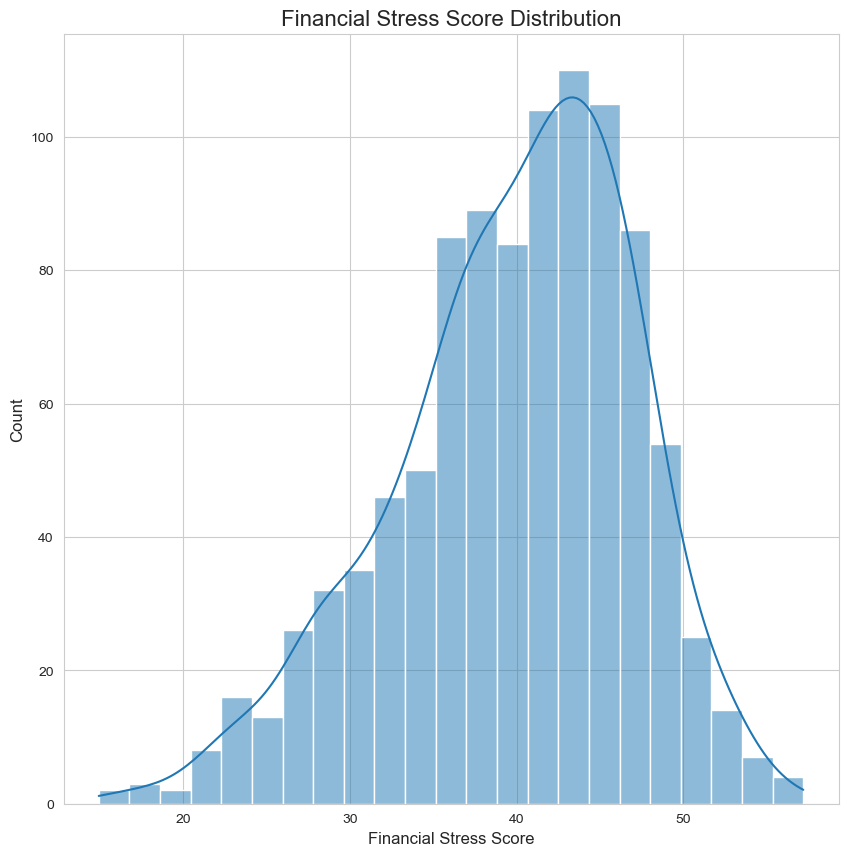

In [38]:
#Financial Stress Score distribution- target variable
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
sns.histplot(x= 'Financial_Stress_Score', data= financial, kde= True)
plt.title("Financial Stress Score Distribution", fontsize= 16)
plt.xlabel("Financial Stress Score", fontsize= 12)
plt.ylabel("Count", fontsize=12);

The Financial Stress Score distribution is approximately normal, with most households having a score between 35 and 45. There are fewer households with extreme low or high stress scores.

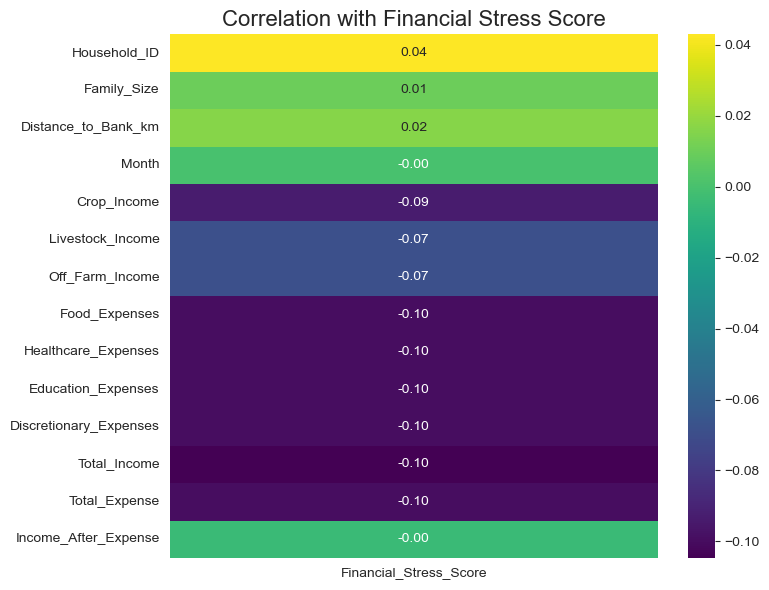

In [39]:
#Select numeric columns
numerical_features = f_analytics.select_dtypes(include='number')

#Exclude binary features
non_binary_features = numerical_features.loc[:, numerical_features.nunique() > 2]

# Compute correlation with Financial_Stress_Score
correlation_with_stress = non_binary_features.corr()['Financial_Stress_Score'].drop('Financial_Stress_Score')
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_with_stress.to_frame(), annot=True, cmap='viridis', fmt='.2f')
plt.title('Correlation with Financial Stress Score', fontsize= 16)
plt.tight_layout()
plt.show()


This heatmap shows the correlation between various numerical features and the financial stress score. Most features have very weak correlations, with values close to zero, indicating minimal linear relationship. Notably, all income and expense variables have a negative correlation around -0.10, suggesting slightly lower stress with higher income/expenses

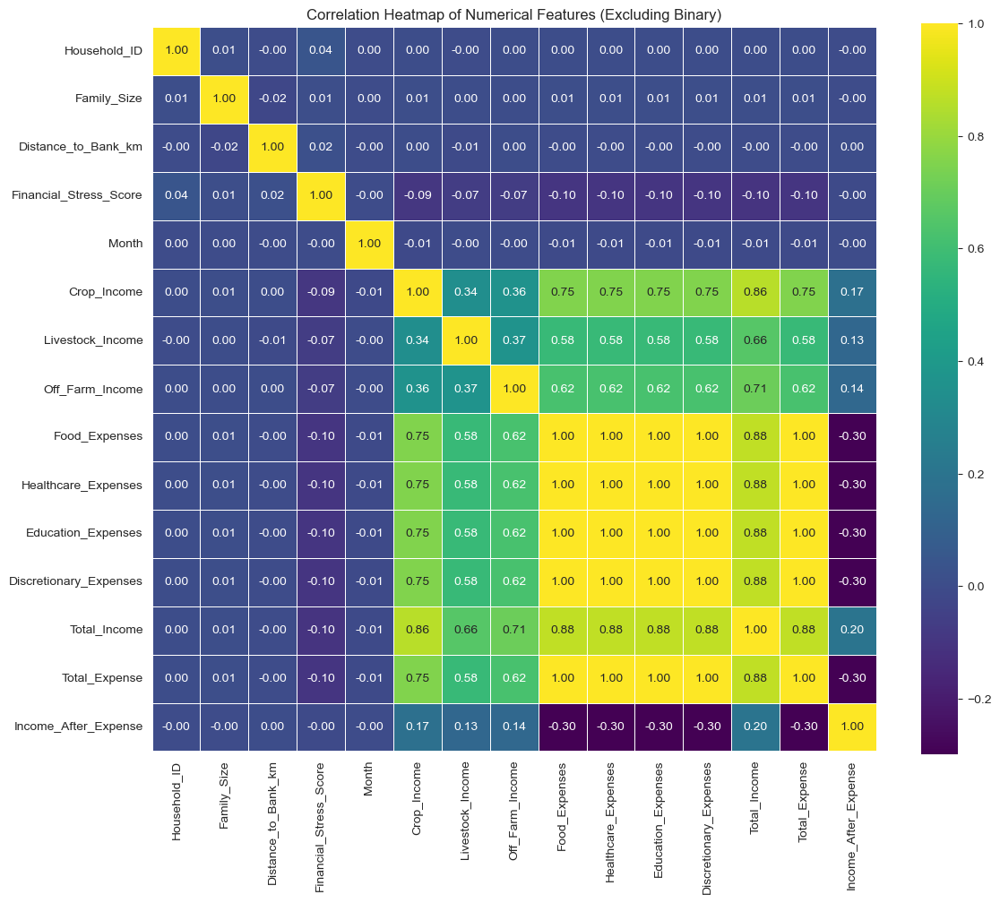

In [40]:
#Select numeric columns
numerical_features = f_analytics.select_dtypes(include='number')


# Exclude binary features 
filtered_features = numerical_features.loc[:, numerical_features.nunique() > 2]

correlation_matrix = filtered_features.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt='.2f', square=True, linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Features (Excluding Binary)')
plt.tight_layout()
plt.show()

This heatmap reveals strong positive correlations between income types (e.g., crop, livestock) and expenses, indicating that higher income is associated with higher spending. Total income is highly correlated with crop income (0.86) and various expense categories (up to 0.88). Financial stress score shows weak negative correlations with most variables, especially with expense and income values

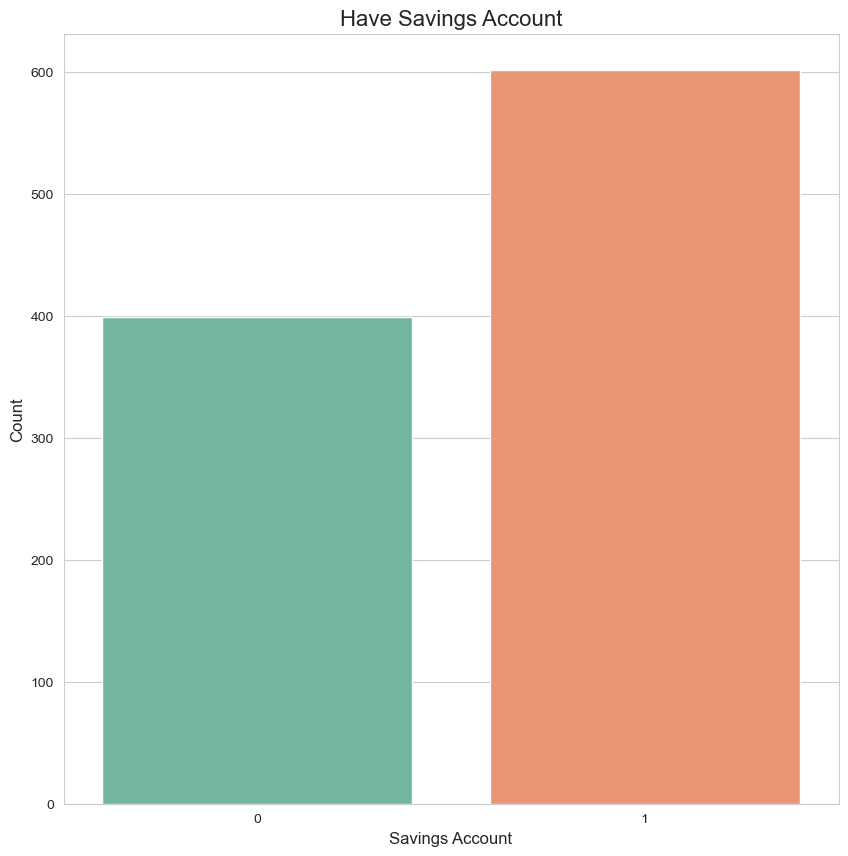

In [41]:
#Has_Savings_Account
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Has_Savings_Account'], palette='Set2')
plt.title("Have Savings Account", fontsize=16)
plt.xlabel("Savings Account", fontsize= 12)
plt.ylabel("Count", fontsize=12);

Majority of the households have a savings account

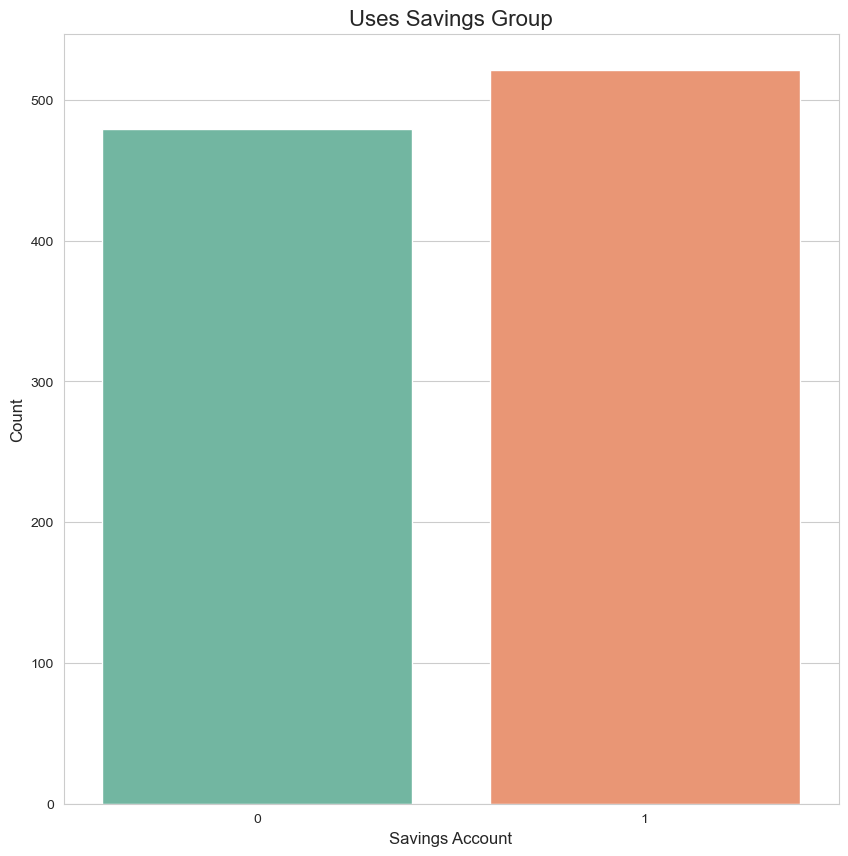

In [42]:
#Uses_Savings_Group
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Uses_Savings_Group'], palette='Set2')
plt.title("Uses Savings Group", fontsize=16)
plt.xlabel("Savings Account", fontsize= 12)
plt.ylabel("Count", fontsize=12);

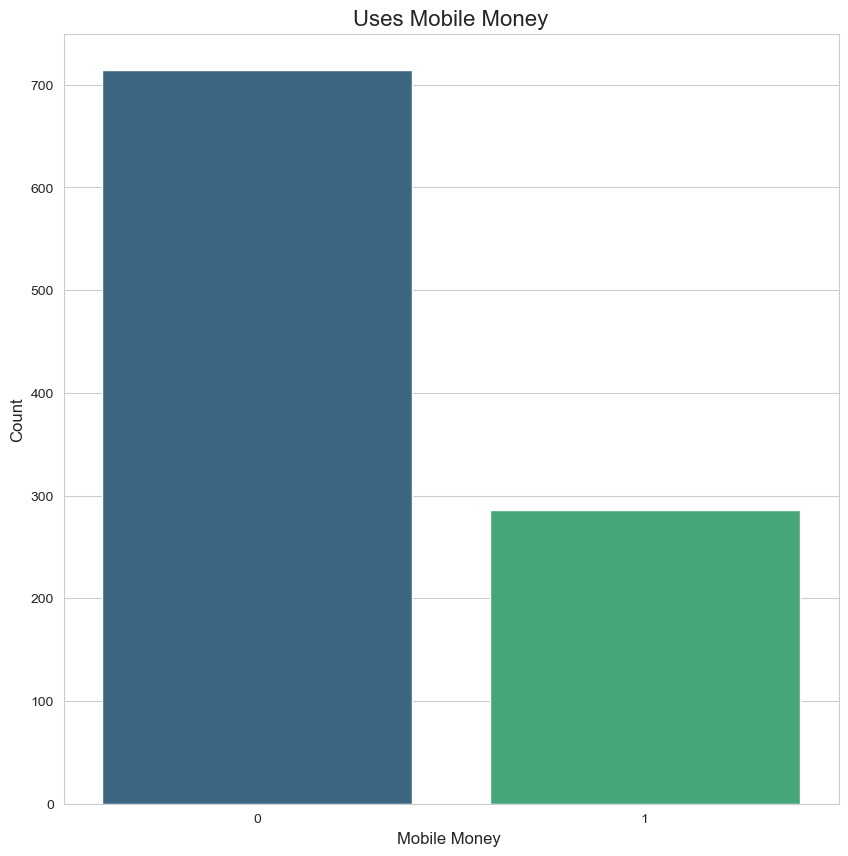

In [43]:
#Uses_Mobile_Money
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Uses_Mobile_Money'], palette='viridis')
plt.title("Uses Mobile Money", fontsize=16)
plt.xlabel("Mobile Money ", fontsize= 12)
plt.ylabel("Count", fontsize=12);

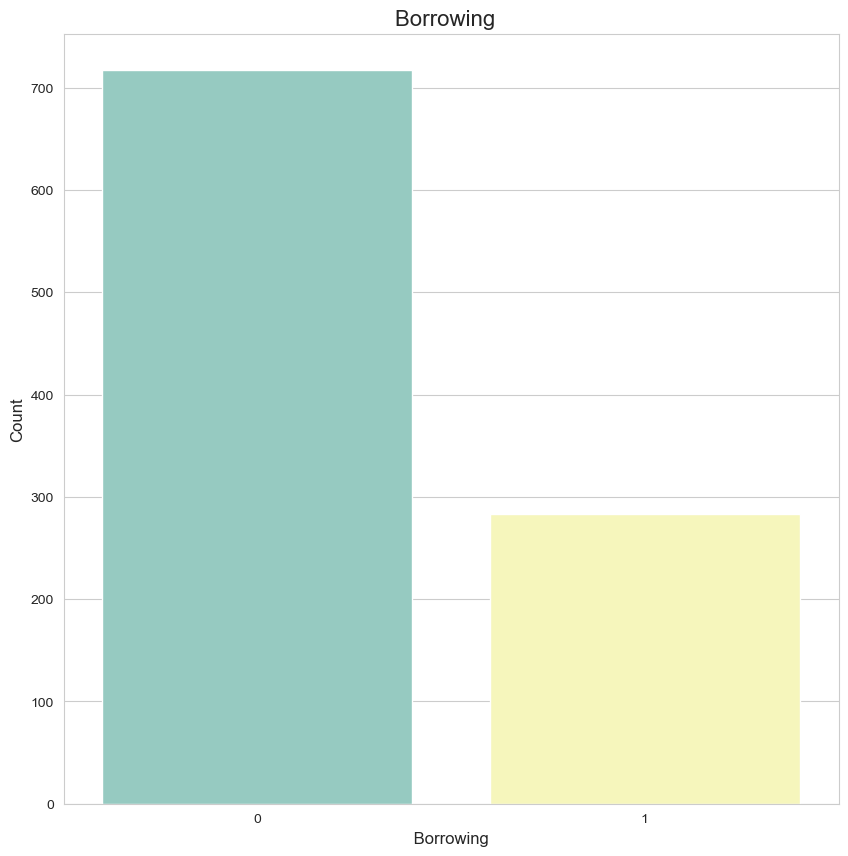

In [44]:
#Borrowing
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Borrowing'], palette='Set3')
plt.title("Borrowing  ", fontsize=16)
plt.xlabel(" Borrowing ", fontsize= 12)
plt.ylabel("Count", fontsize=12);

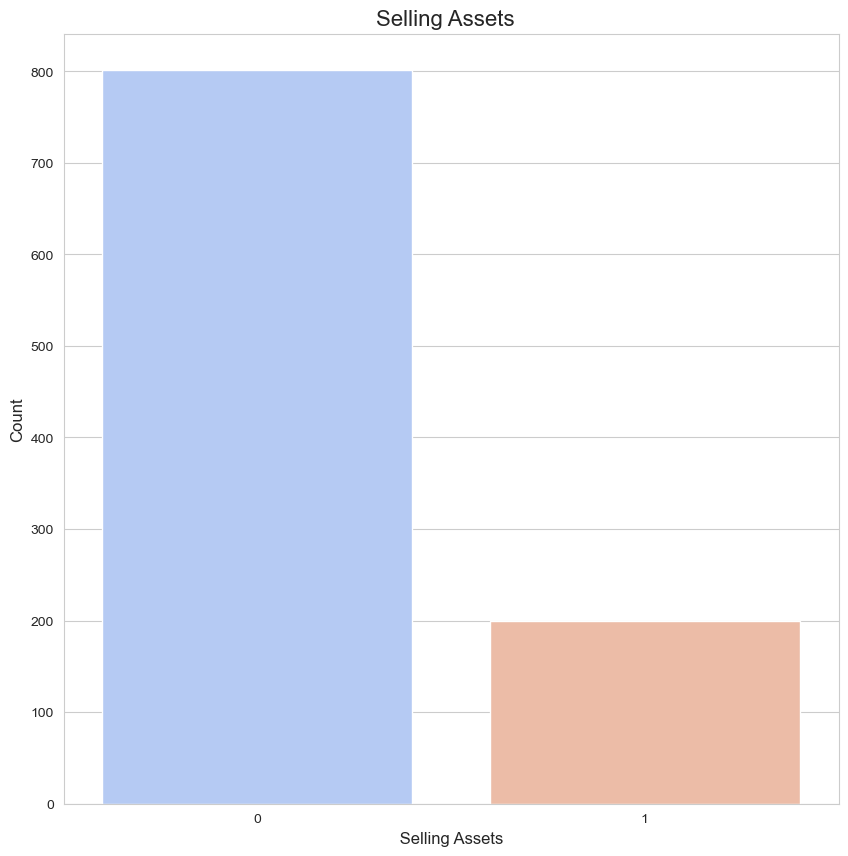

In [45]:
#Selling_Assets
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Selling_Assets'], palette='coolwarm')
plt.title("Selling Assets  ", fontsize=16)
plt.xlabel(" Selling Assets ", fontsize= 12)
plt.ylabel("Count", fontsize=12);

Majority of the families do not sell their assets

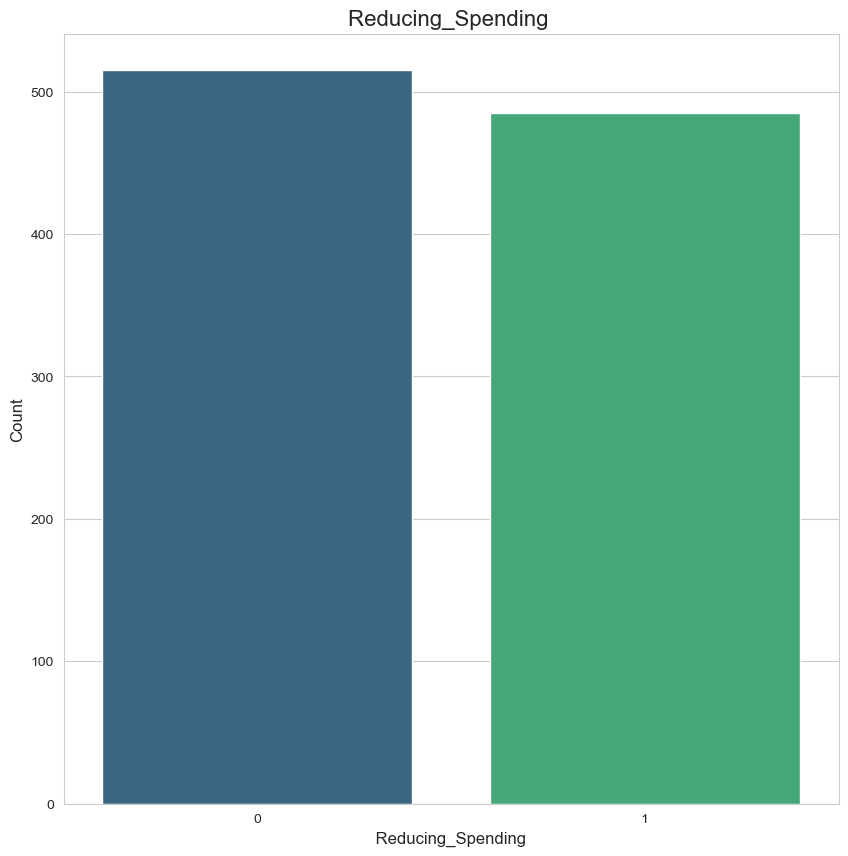

In [46]:
#Reducing_Spending
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Reducing_Spending'], palette='viridis')
plt.title("Reducing_Spending ", fontsize=16)
plt.xlabel(" Reducing_Spending ", fontsize= 12)
plt.ylabel("Count", fontsize=12);

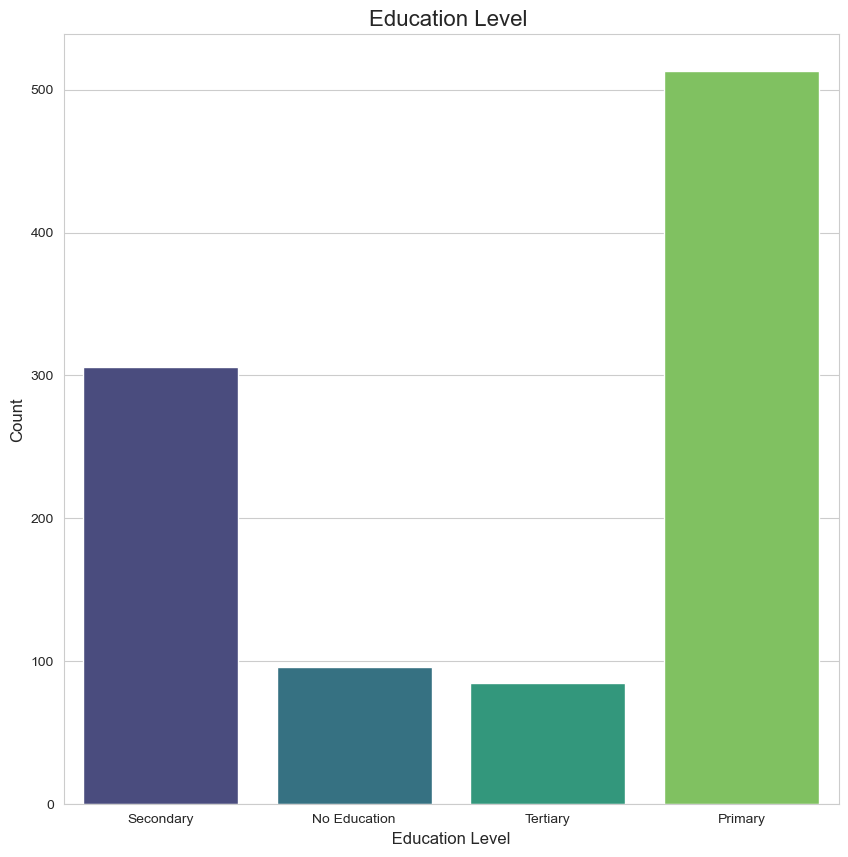

In [47]:
#Education_level
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Education_Level'].fillna('Missing'), palette='viridis')
plt.title("Education Level ", fontsize=16)
plt.xlabel(" Education Level ", fontsize= 12)
plt.ylabel("Count", fontsize=12);

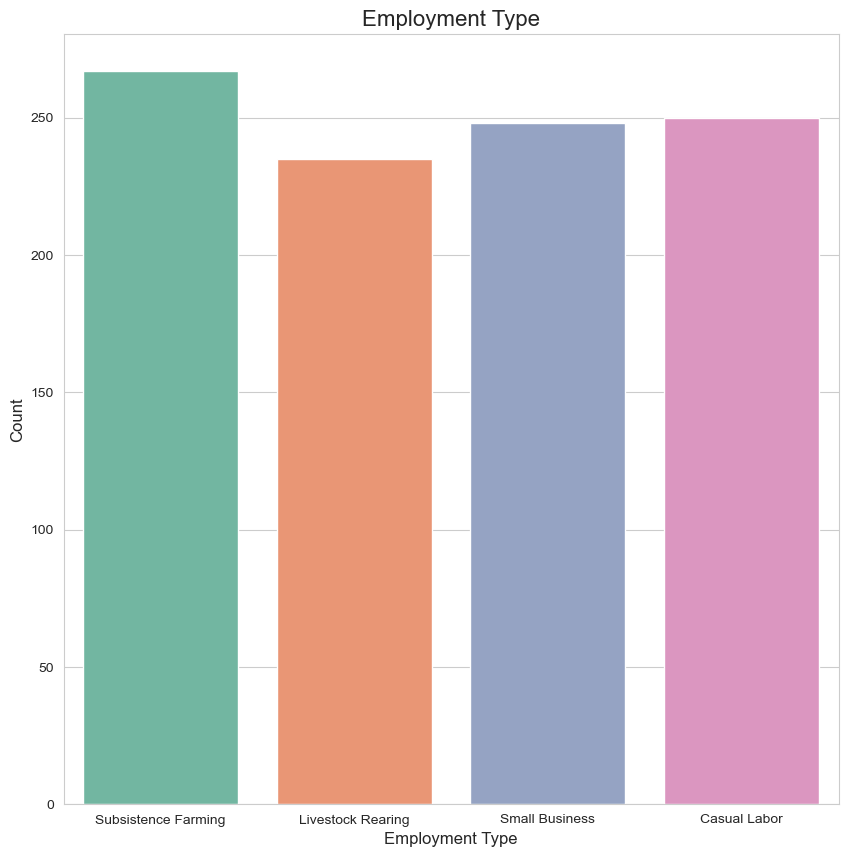

In [48]:
#Employment_Type
plt.figure(figsize=(10,10))
sns.countplot(x= financial['Employment_Type'], palette='Set2')
plt.title("Employment Type", fontsize=16)
plt.xlabel("Employment Type", fontsize= 12)
plt.ylabel("Count", fontsize=12);

Majority of individuals in Uganda are Subsistence Farmers

Demographics

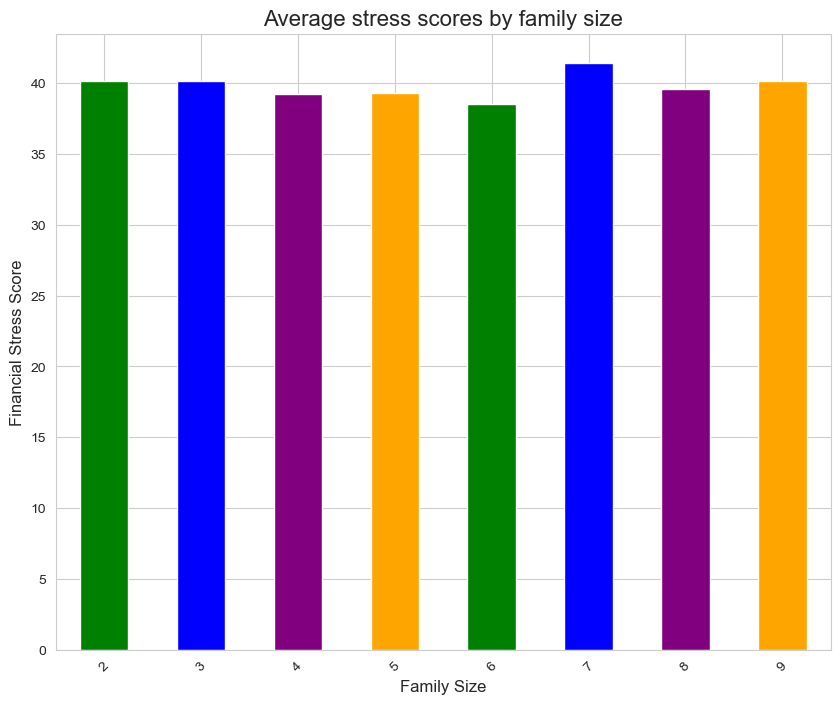

In [49]:
#Family size vs Financial stress score
plt.figure(figsize=(10,8))
avg_stress_score= f_analytics.groupby("Family_Size")["Financial_Stress_Score"].mean()
avg_stress_score.plot(kind= 'bar', color=["green","blue", "purple", "orange"])
plt.title("Average stress scores by family size", fontsize=16)
plt.xlabel("Family Size", fontsize= 12)
plt.ylabel("Financial Stress Score", fontsize=12)
plt.xticks(rotation= 45);

A family of 7 members has the highest average financial stress score of about 43

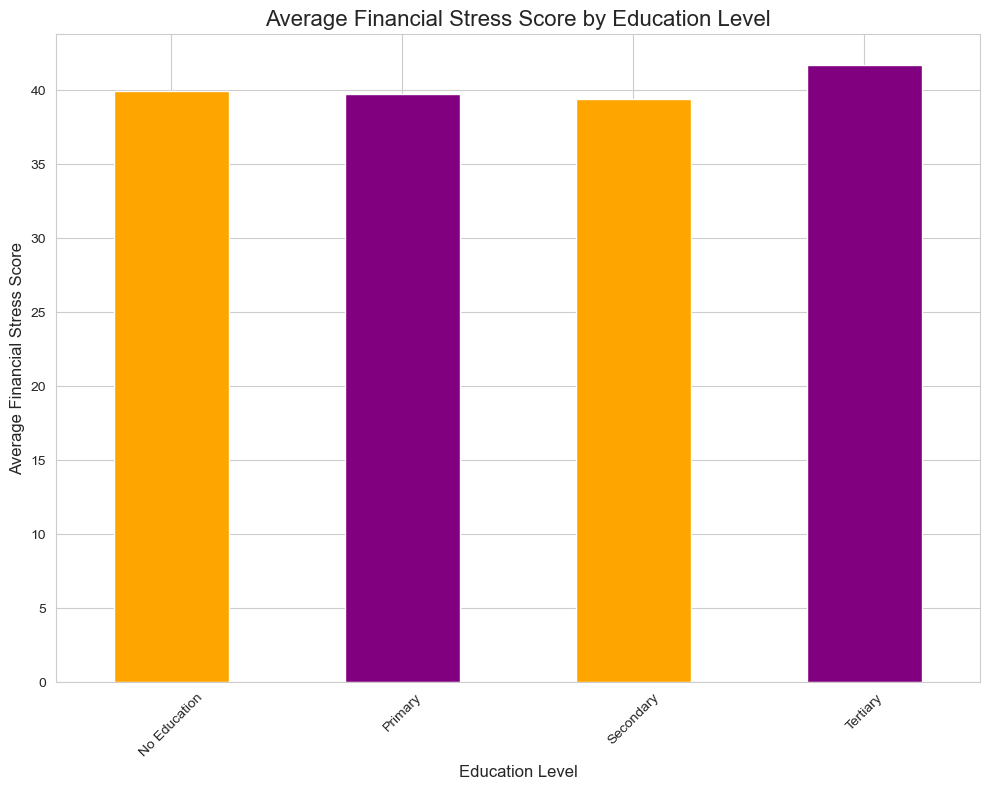

In [50]:
#Education level vs Financial stress
plt.figure(figsize=(10,8))
education_stress= f_analytics.groupby("Education_Level")["Financial_Stress_Score"].mean()
education_stress.plot(kind='bar', color= ["orange", "purple"])
plt.title("Average Financial Stress Score by Education Level", fontsize=16)
plt.xlabel("Education Level", fontsize=12)
plt.ylabel("Average Financial Stress Score", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

Individuals with tertiary education have a financial stress score

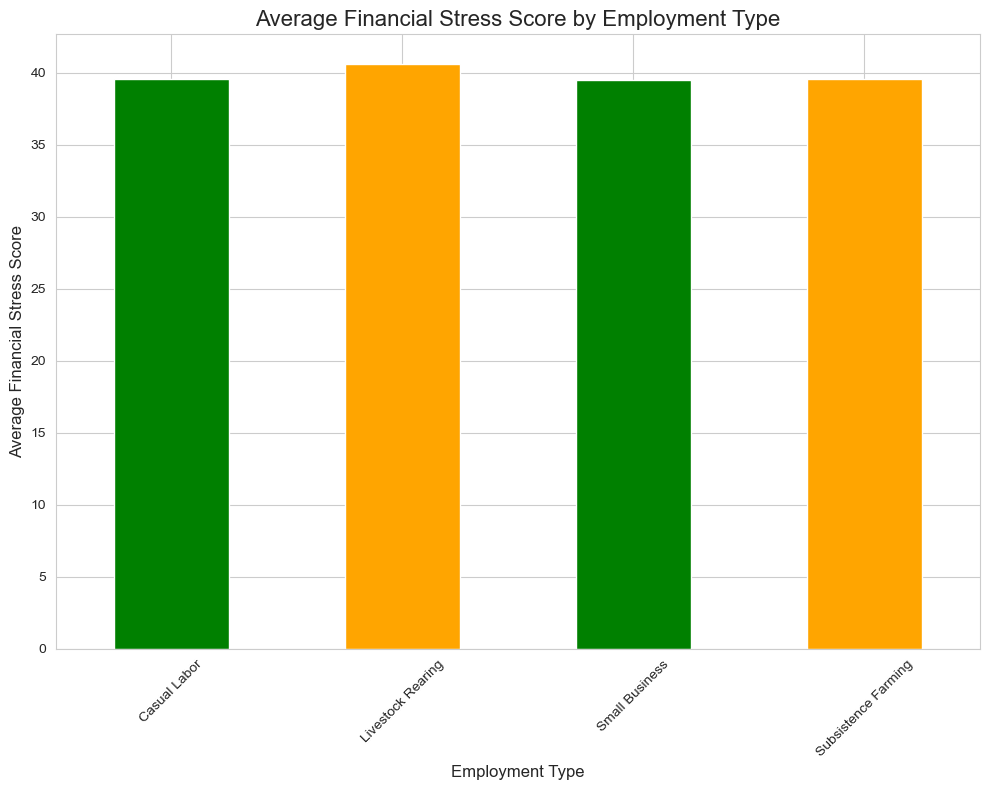

In [51]:
#Employment type vs Financial stress
plt.figure(figsize=(10,8))
avg_stress_employ= f_analytics.groupby("Employment_Type")["Financial_Stress_Score"].mean()
avg_stress_employ.plot(kind="bar", color=["green","orange"])
plt.title("Average Financial Stress Score by Employment Type", fontsize=16)
plt.xlabel("Employment Type", fontsize=12)
plt.ylabel("Average Financial Stress Score", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

The financial stress score is slightly higher for livestock rearing individuals. The other individuals their stress score is relatively equal

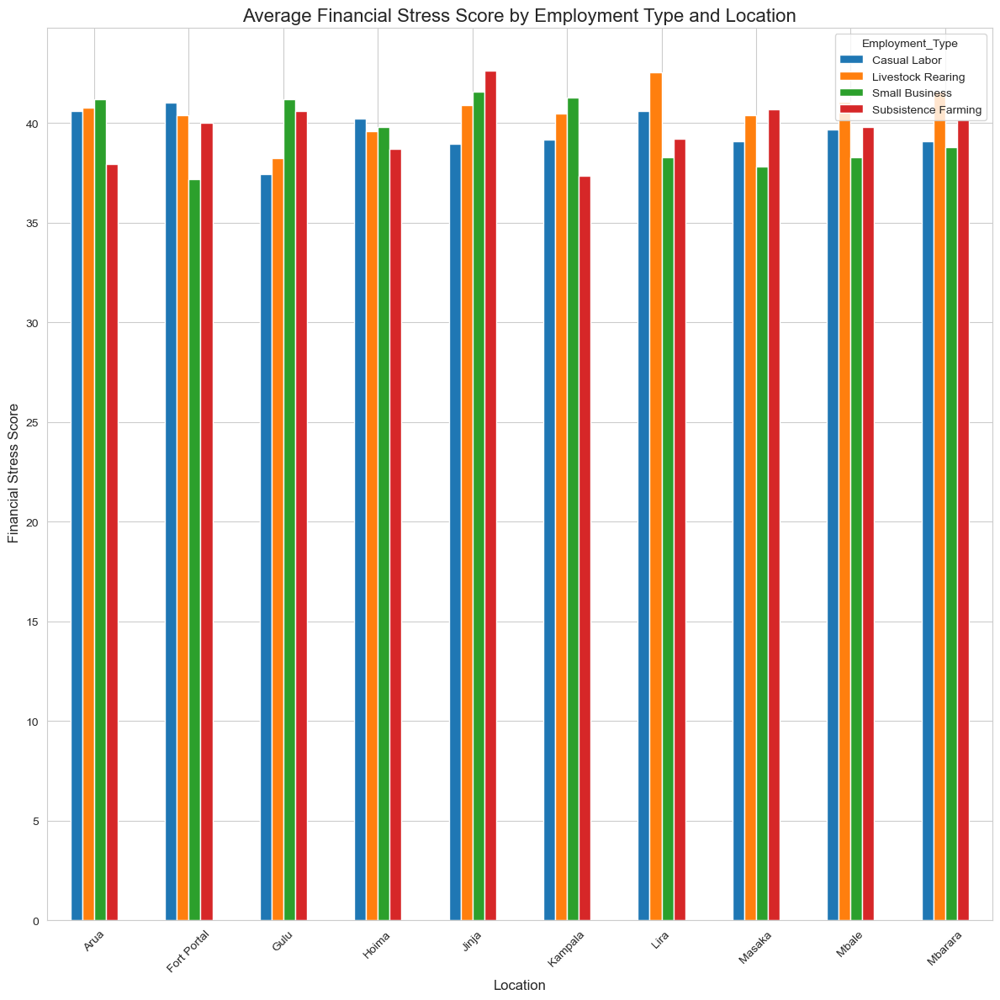

In [52]:
#Employment vs Location vs Financial stress score
stress_by_location_employment = (
    f_analytics.groupby(["Location", "Employment_Type"])["Financial_Stress_Score"].mean().unstack()
)
stress_by_location_employment.plot(kind="bar", figsize=(12, 12))
plt.title("Average Financial Stress Score by Employment Type and Location", fontsize=16)
plt.xlabel("Location", fontsize=12)
plt.ylabel(" Financial Stress Score", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

The visual illustrates the average financial stress scores across various employment types in Ugandan locations such as Arua, Gulu, Jinja, Kampala, and Masaka. Households engaged in casual labor and livestock rearing generally experience higher stress levels across most locations compared to those in small businesses or subsistence farming. This suggests that irregular income sources contribute more to financial instability, particularly in regions like Jinja and Gulu.

Coping Mechanisms During Financial Stress

In [53]:
coping_mechanisms = ["Borrowing", "Selling_Assets", "Reducing_Spending",]
for col in coping_mechanisms:
    avg_stress = f_analytics.groupby(col)["Financial_Stress_Score"].mean()
    print(f"Stress for {col}:")
    print(avg_stress)

Stress for Borrowing:
Borrowing
0    42.706318
1    32.532968
Name: Financial_Stress_Score, dtype: float64
Stress for Selling_Assets:
Selling_Assets
0    41.695306
1    32.308141
Name: Financial_Stress_Score, dtype: float64
Stress for Reducing_Spending:
Reducing_Spending
0    39.912757
1    39.736474
Name: Financial_Stress_Score, dtype: float64


Households that do not borrow have a higher average stress score (42.7) than those that do borrow (32.5).
Borrowing seems to relieve some financial stress.

Households that don’t sell assets have a higher stress score (41.7) compared to those that do sell (32.3).
Selling assets appears to reduce financial stress, though it may not be sustainable.

The stress levels are almost the same for those who reduce spending (39.7) and those who don’t (39.9).
Cutting expenses has minimal impact on reducing stress

In [54]:
Borrowing_During_Stress = f_analytics["Borrowing"].mean() * 100
print("Borrowing during stress as a percentage: {:.2f}%".format(Borrowing_During_Stress))


Borrowing during stress as a percentage: 28.30%


In [55]:
#Average stress score
avg_stress_score=f_analytics["Financial_Stress_Score"].mean()
avg_stress_score

39.82726

This boxplot compares financial stress scores between households with and without a savings account. Both groups show similar distributions, with slightly lower medians and fewer outliers in households with accounts. Overall, having a savings account doesn't significantly reduce stress scores based on this visual.

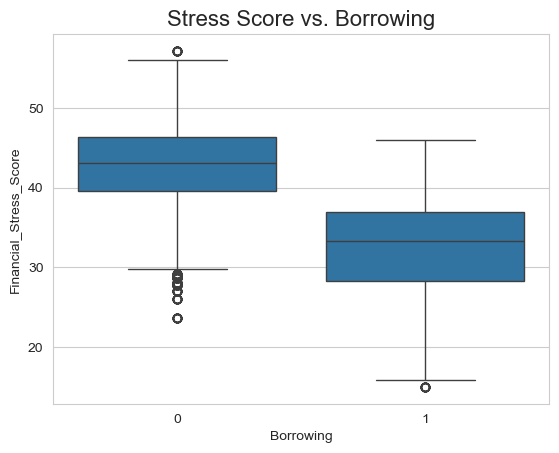

In [56]:
#Stress Score vs. Borrowing
financial_access_summary = f_analytics.groupby('Borrowing')[['Financial_Stress_Score']].mean()
sns.boxplot(x='Borrowing', y='Financial_Stress_Score', data=f_analytics)
plt.title("Stress Score vs. Borrowing", fontsize=16)
plt.show()

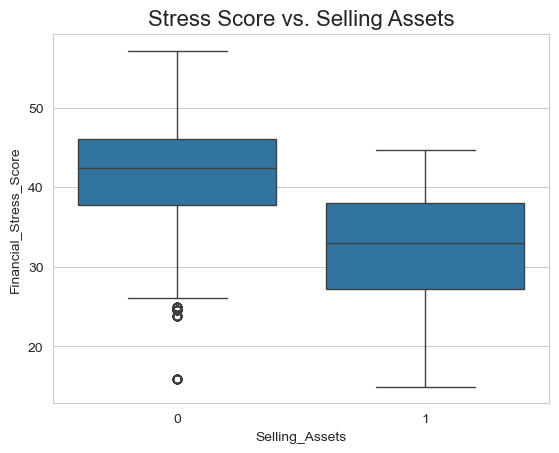

In [57]:
#Stress Score vs. Selling_Assets
financial_access_summary = f_analytics.groupby('Selling_Assets')[['Financial_Stress_Score']].mean()
sns.boxplot(x='Selling_Assets', y='Financial_Stress_Score', data=f_analytics)
plt.title("Stress Score vs. Selling Assets", fontsize=16)
plt.show()

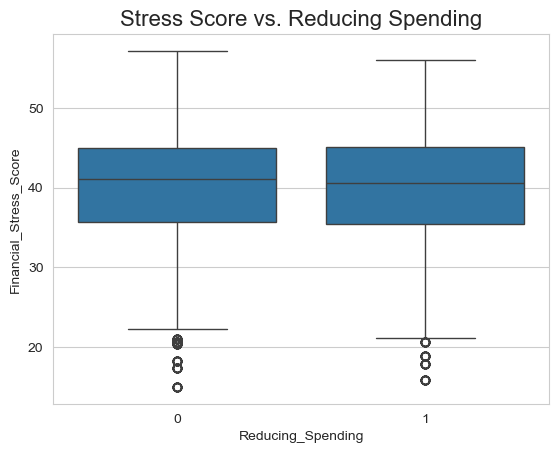

In [58]:
#Stress Score vs. Reducing_Spending
financial_access_summary = f_analytics.groupby('Reducing_Spending')[['Financial_Stress_Score']].mean()
sns.boxplot(x='Reducing_Spending', y='Financial_Stress_Score', data=f_analytics)
plt.title("Stress Score vs. Reducing Spending", fontsize=16)
plt.show()

Assess Financial Tools

In [59]:
tools = ["Has_Savings_Account", "Uses_Savings_Group", "Uses_Mobile_Money"]
for tool in tools:
    effect = f_analytics.groupby(tool)["Financial_Stress_Score"].mean()
    print(f"Stress for {tool}:")
    print(effect)

Stress for Has_Savings_Account:
Has_Savings_Account
0    39.824662
1    39.828985
Name: Financial_Stress_Score, dtype: float64
Stress for Uses_Savings_Group:
Uses_Savings_Group
0    39.990459
1    39.677217
Name: Financial_Stress_Score, dtype: float64
Stress for Uses_Mobile_Money:
Uses_Mobile_Money
0    39.981120
1    39.443147
Name: Financial_Stress_Score, dtype: float64


Households with and without savings accounts have nearly identical stress scores (~39.8).
Merely having a savings account doesn’t correlate strongly with lower stress.

Households with and without Uses_Savings_Group have nearly identical stress scores.
Merely having a savings account doesn’t correlate strongly with lower stress. 

Households that use Uses_Mobile_Money have nearly identical stress scores.
Using mobile money doesn’t correlate strongly with lower stress. 

Understand the extent to which seasonal income fluctuations impact household financial stability

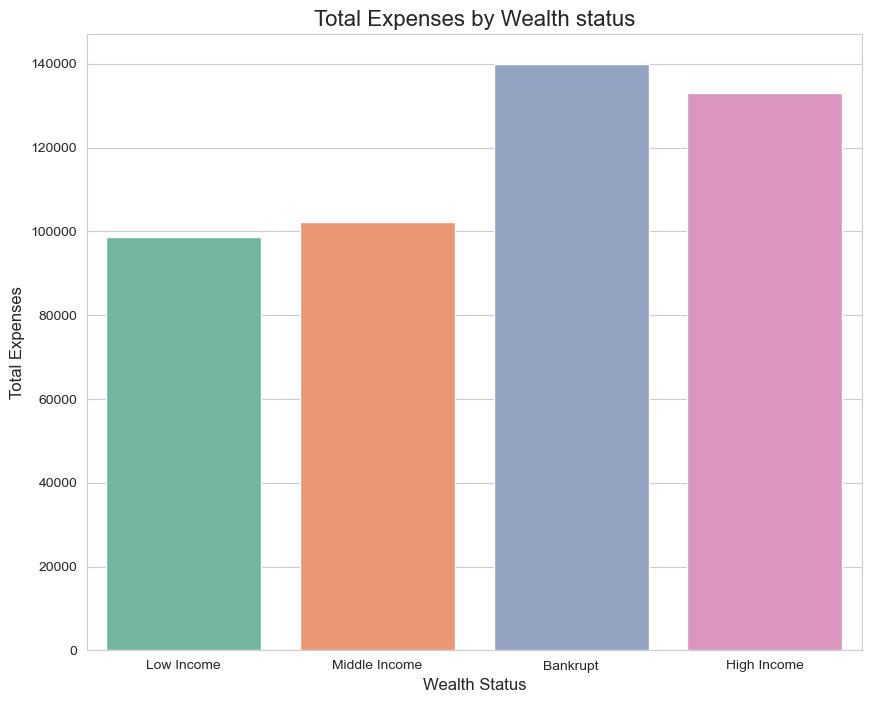

In [60]:
#Expenses based on wealth status
plt.figure(figsize=(10,8))
sns.barplot(x="Wealth_Status", y= "Total_Expense", data=f_analytics, ci=None, palette='Set2')
plt.title("Total Expenses by Wealth status", fontsize=16)
plt.xlabel("Wealth Status", fontsize= 12)
plt.ylabel("Total Expenses", fontsize=12);

This bar chart visualizes Total Expenses by Wealth Status across different income groups: Low Income, Middle Income, Bankrupt, and High Income.
the Bankrupt group shows the highest total expenses, even surpassing the High Income group.
High Income households come next, followed by Middle Income and Low Income, in that order.

Investigating spending patterns and financial resilience across different wealth categories.

In [61]:
# Compare average expenses
spending_summary = f_analytics.groupby('Wealth_Status')[['Discretionary_Expenses', 'Food_Expenses', 'Education_Expenses','Healthcare_Expenses', 'Total_Expense']].mean().sort_values(by= 'Total_Expense', ascending= False)
spending_summary


,Discretionary_Expenses,Food_Expenses,Education_Expenses,Healthcare_Expenses,Total_Expense
Wealth_Status,,,,,
Bankrupt,35009.244182,70018.986665,21005.345578,14003.391873,140036.968298
High Income,33277.128959,66554.772624,19966.092760,13310.532805,133108.527149
Middle Income,25547.266579,51095.035697,15328.162764,10218.608155,102189.073195
Low Income,24672.405077,49345.320751,14803.244040,9868.661038,98689.630905


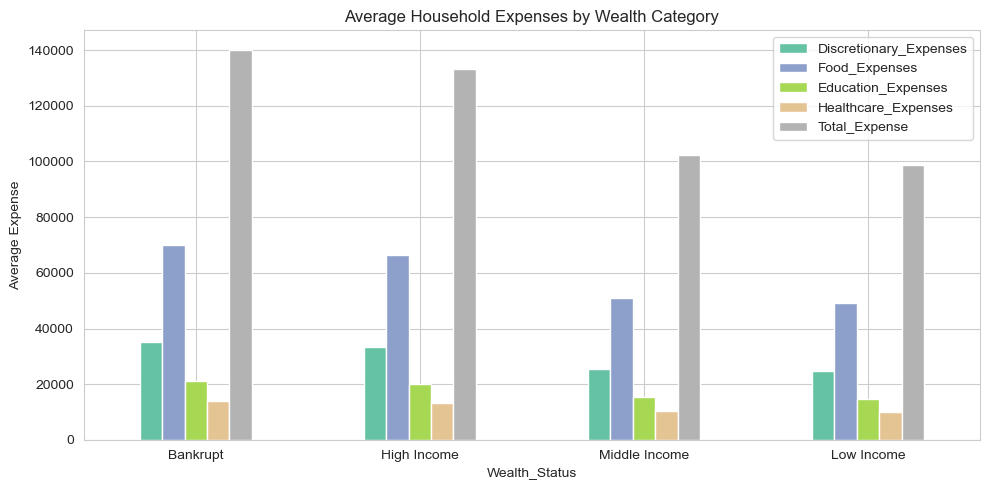

In [62]:
spending_summary.plot(kind='bar', figsize=(10, 5), colormap='Set2')
plt.title("Average Household Expenses by Wealth Category")
plt.ylabel("Average Expense")
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()
plt.show()

In [63]:
resilience_by_wealth_location = f_analytics.groupby(['Wealth_Status', 'Location'])[
    ['Borrowing', 'Selling_Assets', 'Reducing_Spending', 'Has_Savings_Account', 'Financial_Stress_Score']
].mean().reset_index().sort_values(by='Financial_Stress_Score', ascending=False)
resilience_by_wealth_location.head(10)


,Wealth_Status,Location,Borrowing,Selling_Assets,Reducing_Spending,Has_Savings_Account,Financial_Stress_Score
24,Low Income,Jinja,0.222694,0.186638,0.547190,0.630965,41.264507
34,Middle Income,Jinja,0.212329,0.181507,0.523973,0.618151,40.956147
4,Bankrupt,Jinja,0.223618,0.175879,0.541457,0.547739,40.707412
26,Low Income,Lira,0.274274,0.149149,0.452452,0.567568,40.636376
10,High Income,Arua,0.310811,0.108108,0.418919,0.648649,40.319730
39,Middle Income,Mbarara,0.263866,0.176471,0.510924,0.611765,40.300857
29,Low Income,Mbarara,0.286414,0.160343,0.458996,0.609547,40.118911
16,High Income,Lira,0.278261,0.147826,0.504348,0.565217,40.059652
6,Bankrupt,Lira,0.278396,0.145880,0.420935,0.550111,40.056570
20,Low Income,Arua,0.283410,0.194700,0.508065,0.656682,40.031198


Insights
This table shows the Top 10 households with the highest financial stress scores, segmented by their Wealth Status and Location, along with their coping strategies and savings access.
Jinja appears 3 times, suggesting a concentration of financial stress there — across all wealth levels (including a "Bankrupt" category).

Even High Income households (like in Arua and Lira) show elevated stress scores (~40), indicating that wealth doesn’t fully shield against stress.

Low Income households (like in Lira, Arua, and Mbarara) make up half of this top 10, showing how vulnerable this group is.

Savings access is moderate to high (55%–65%) across all groups — yet it’s not always enough to reduce stress.

Borrowing and spending reduction are the most common coping mechanisms.

Top 10 Households

In [64]:
top10_income = f_analytics.sort_values(by='Total_Income', ascending=False).head(10)
top10_income = top10_income[['Household_ID', 'Location','Off_Farm_Income','Livestock_Income', 'Crop_Income','Total_Income', 'Total_Expense', 'Financial_Stress_Score', 'Wealth_Status']]
top10_income


,Household_ID,Location,Off_Farm_Income,Livestock_Income,Crop_Income,Total_Income,Total_Expense,Financial_Stress_Score,Wealth_Status
9253,386,Hoima,85793,71319,145909,303021,261080,41.13,Middle Income
20274,845,Lira,83860,69939,147209,301008,273805,36.59,Middle Income
2407,101,Gulu,84185,71300,142066,297551,203303,44.44,High Income
20593,859,Lira,82742,66922,144792,294456,303724,15.89,Bankrupt
11868,495,Fort Portal,83500,58643,147462,289605,174387,37.17,High Income
9644,402,Kampala,81093,62941,142897,286931,323303,44.89,Bankrupt
19384,808,Masaka,84067,59625,142809,286501,192001,34.31,High Income
21352,890,Jinja,71552,64506,148979,285037,213955,45.38,High Income
21929,914,Jinja,66467,72009,146410,284886,223155,40.07,High Income
22071,920,Fort Portal,78290,68868,137615,284773,335233,41.96,Bankrupt


Seasonal patterns

In [95]:
f_analytics['YearMonth'] = pd.to_datetime(f_analytics['Year_month'], format='%b-%y')
f_analytics['YearMonth'] 

0       2023-01-01
1       2023-02-01
2       2023-03-01
3       2023-04-01
4       2023-05-01
           ...    
23995   2024-08-01
23996   2024-09-01
23997   2024-10-01
23998   2024-11-01
23999   2024-12-01
Name: YearMonth, Length: 24000, dtype: datetime64[ns]

In [96]:
f_analytics['Month'] = f_analytics['YearMonth'].dt.month
f_analytics['Year'] = f_analytics['YearMonth'].dt.year


In [97]:
f_analytics['Month_Year'] = f_analytics['YearMonth'].dt.strftime('%b-%Y')  # e.g., Jan-2023



In [102]:
monthly_summary = f_analytics.groupby('YearMonth')[
    ['Total_Income', 'Total_Expense', 'Financial_Stress_Score']
].mean().reset_index()
monthly_summary

,YearMonth,Total_Income,Total_Expense,Financial_Stress_Score
0,2023-01-01,127123.484,114818.545,39.82726
1,2023-02-01,126745.199,113875.440,39.82726
2,2023-03-01,126413.265,113120.077,39.82726
3,2023-04-01,129249.443,115546.378,39.82726
4,2023-05-01,127929.254,115001.201,39.82726
5,2023-06-01,127842.996,115797.650,39.82726
6,2023-07-01,126152.045,112891.538,39.82726
7,2023-08-01,127189.338,115279.166,39.82726
8,2023-09-01,129534.261,117946.472,39.82726
9,2023-10-01,130213.449,117354.211,39.82726


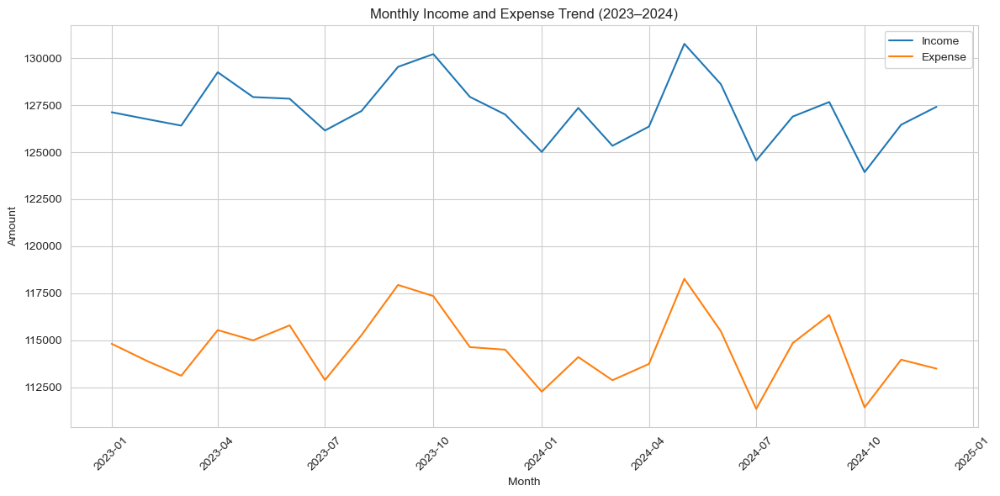

In [101]:
# Income & Expense Trend
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_summary, x='YearMonth', y='Total_Income', label='Income')
sns.lineplot(data=monthly_summary, x='YearMonth', y='Total_Expense', label='Expense')
plt.title("Monthly Income and Expense Trend (2023–2024)")
plt.xlabel("Month")
plt.ylabel("Amount")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


Income consistently remains higher than expenses, indicating net positive cash flow across months
Income peaked around May 2023 and May 2024
Noticeable drops occurred around October 2023 and January 2024
There's a spike in May 2024, similar to income.
Lowest expenses were recorded around October 2024.
The spikes and dips in both income and expenses suggest seasonal or financial behavior

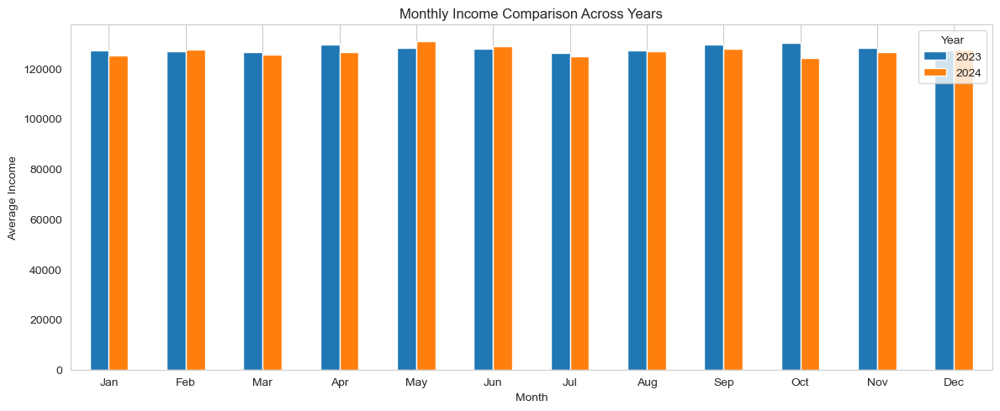

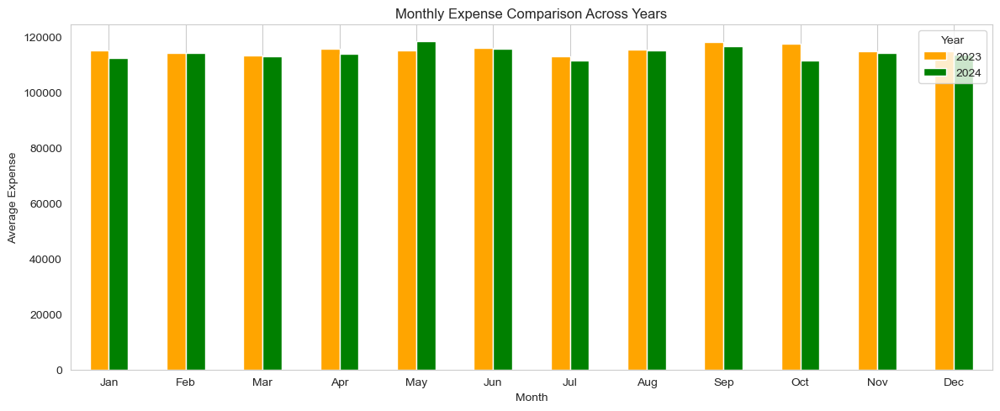

In [70]:
#How did income/expense in Jan 2023 compare to Jan 2024?
f_analytics['Month'] = f_analytics['YearMonth'].dt.strftime('%b')  # e.g., Jan, Feb
f_analytics['Year'] = f_analytics['YearMonth'].dt.year


monthly_compare = f_analytics.groupby(['Year', 'Month'])[
    ['Total_Income', 'Total_Expense']
].mean().reset_index()

# Pivot for plotting
pivot_income = monthly_compare.pivot(index='Month', columns='Year', values='Total_Income')
pivot_expense = monthly_compare.pivot(index='Month', columns='Year', values='Total_Expense')

# Sort months properly
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
pivot_income = pivot_income.reindex(month_order)
pivot_expense = pivot_expense.reindex(month_order)

pivot_income.plot(kind='bar', figsize=(12, 5), title='Monthly Income Comparison Across Years')
plt.ylabel('Average Income')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

pivot_expense.plot(kind='bar', figsize=(12, 5), title='Monthly Expense Comparison Across Years', color=['orange', 'green'])
plt.ylabel('Average Expense')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


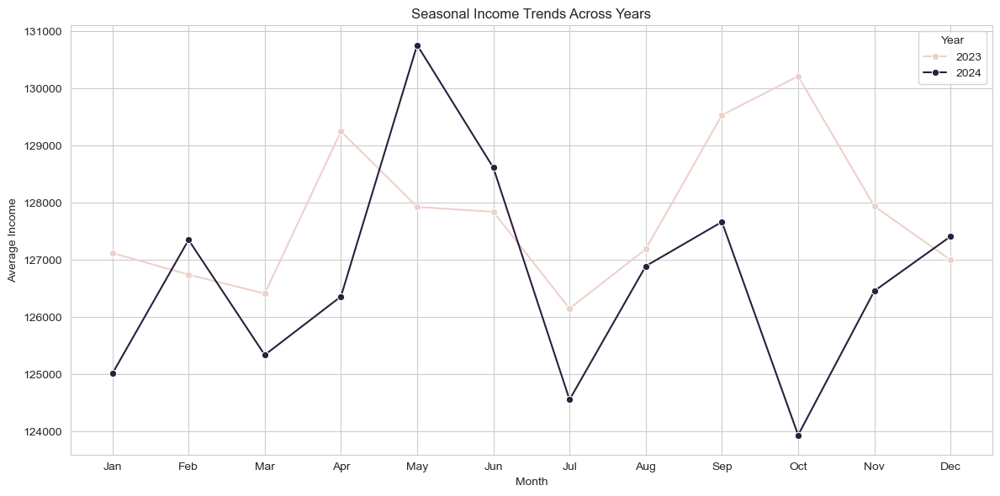

In [71]:
#monthly income trend line by year
plt.figure(figsize=(12, 6))
sns.lineplot(data=f_analytics, x='Month', y='Total_Income', hue='Year', 
             estimator='mean', ci=None, marker='o')

plt.title('Seasonal Income Trends Across Years')
plt.ylabel('Average Income')
plt.grid(True)
plt.tight_layout()
plt.show()


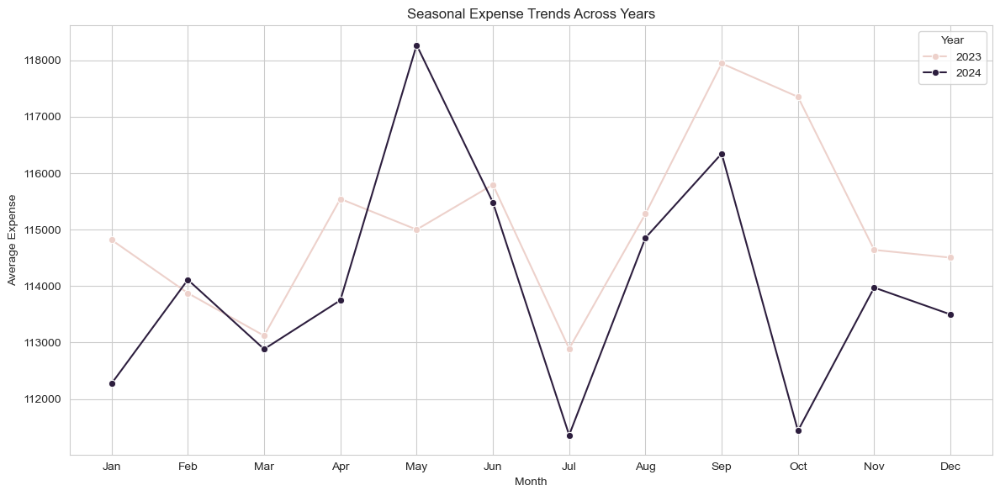

In [72]:
#Monthly expense trend line by year
plt.figure(figsize=(12, 6))
sns.lineplot(data=f_analytics, x='Month', y='Total_Expense', hue='Year', 
             estimator='mean', ci=None, marker='o')

plt.title('Seasonal Expense Trends Across Years')
plt.ylabel('Average Expense')
plt.grid(True)
plt.tight_layout()
plt.show()


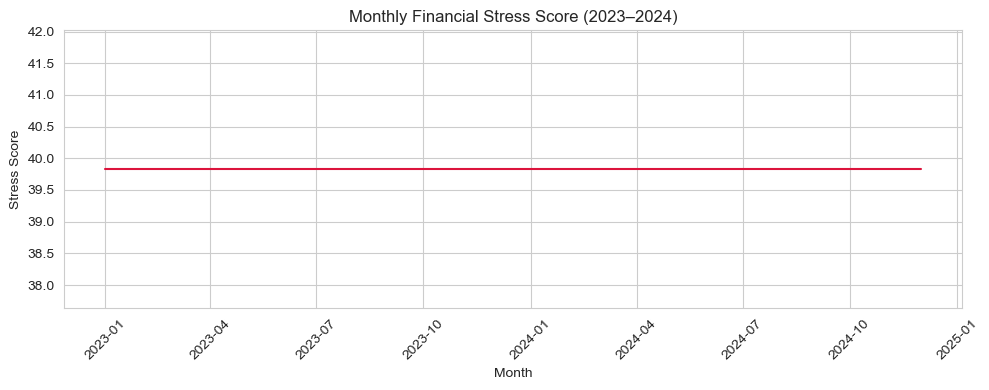

In [103]:
# Financial Stress Score Trend
plt.figure(figsize=(10, 4))
sns.lineplot(data=monthly_summary, x='YearMonth', y='Financial_Stress_Score', color='crimson')
plt.title("Monthly Financial Stress Score (2023–2024)")
plt.xlabel("Month")
plt.ylabel("Stress Score")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

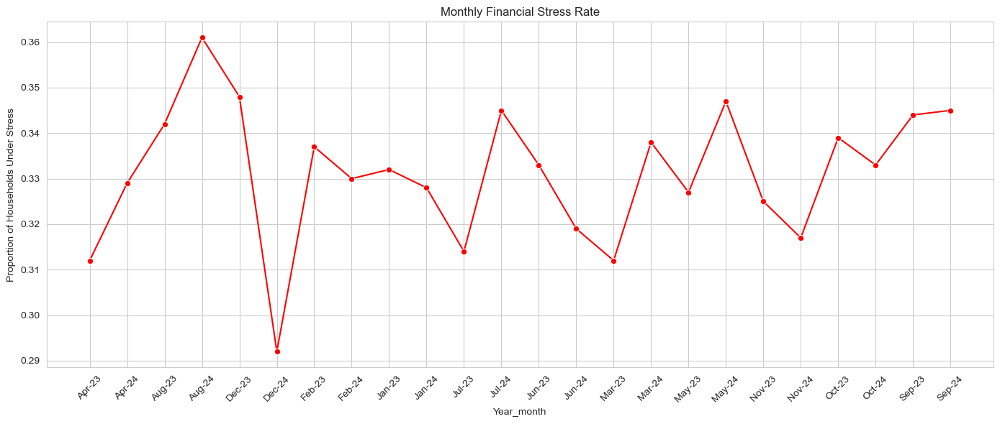

In [ ]:
# Creating stress indicator: Assume stress if expense > income
f_analytics['Financial_Stress'] = f_analytics['Total_Expense'] > f_analytics['Total_Income']

# Monthly stress rates
stress_by_month = f_analytics.groupby('Year_month')['Financial_Stress'].mean().reset_index()
plt.figure(figsize=(14,6))
sns.lineplot(data=stress_by_month, x='Year_month', y='Financial_Stress', marker='o', color='red')
plt.title("Monthly Financial Stress Rate")
plt.ylabel("Proportion of Households Under Stress")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


This chart shows the monthly financial stress per household that fluctuates over time. Dec 2024 has the lowest stress, we may assume this is due to the harvest season. Aug 2024 has the highest financial stress, this might indicate a non harvest period

Trend Analysis

In Uganda, harvest seasons typically fall into two main periods:

First Harvest Season: June to July​

Second Harvest Season: December to January

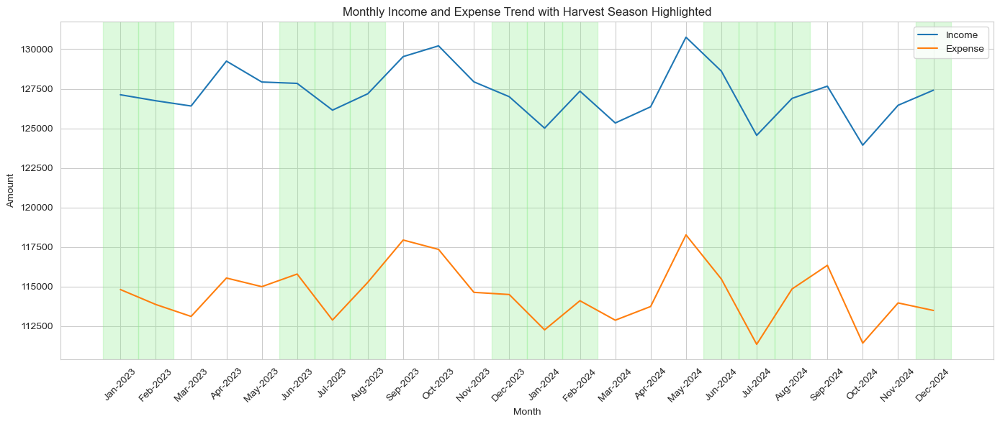

In [ ]:
#Use 􀆟me-series analysis to identify trends in income and expenses over different seasons (harvest vs. non-harvest).

monthly_data = f_analytics.groupby('YearMonth').agg({
    'Total_Income': 'mean',
    'Total_Expense': 'mean',
    'Financial_Stress_Score': 'mean'
}).reset_index()

#Assign Season based on Month
f_analytics['Season'] = f_analytics['Month'].apply(lambda x: 'Harvest' if x in [6, 7, 12, 1] else 'Non-Harvest')

monthly_data['Month_Label'] = monthly_data['YearMonth'].dt.strftime('%b-%Y')

# Plot with harvest shading and formatted x-axis
plt.figure(figsize=(14, 6))
sns.lineplot(data=monthly_data, x='Month_Label', y='Total_Income', label='Income')
sns.lineplot(data=monthly_data, x='Month_Label', y='Total_Expense', label='Expense')

# Shade harvest months
for idx, row in monthly_data.iterrows():
    if row['YearMonth'].month in harvest_months:
        plt.axvspan(idx - 0.5, idx + 0.5, color='lightgreen', alpha=0.3)

plt.title('Monthly Income and Expense Trend with Harvest Season Highlighted')
plt.xticks(rotation=45)
plt.ylabel("Amount")
plt.xlabel("Month")
plt.grid(True)
plt.tight_layout()
plt.show()


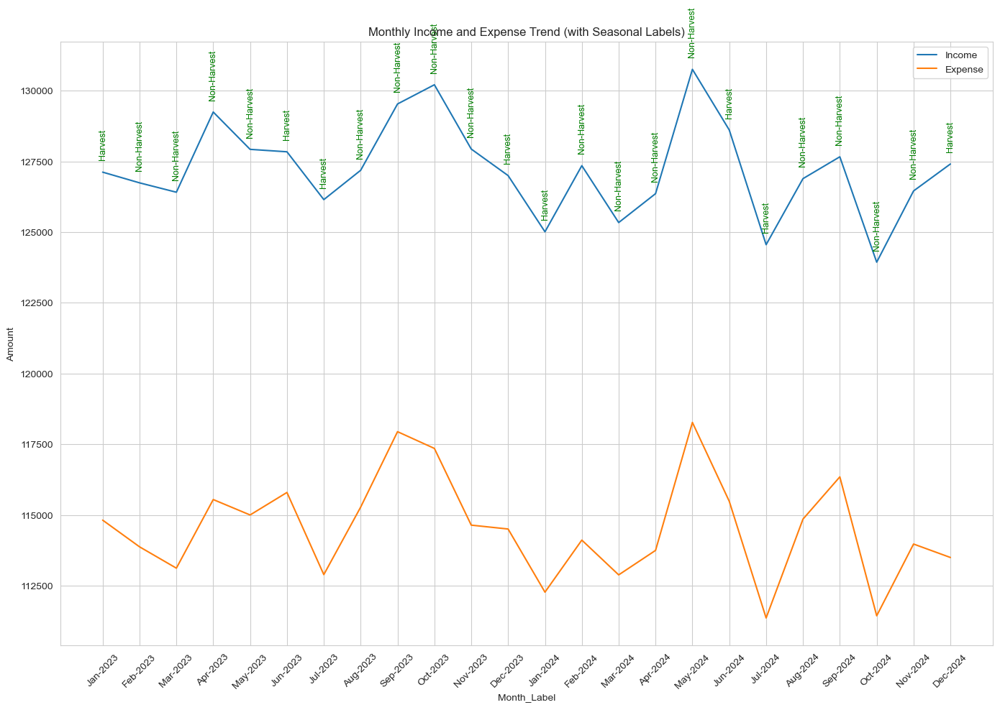

In [ ]:
# Income and Expenses with Season Labels
plt.figure(figsize=(14, 10))
sns.lineplot(data=monthly_data, x='Month_Label', y='Total_Income', label='Income')
sns.lineplot(data=monthly_data, x='Month_Label', y='Total_Expense', label='Expense')

# Add season labels correctly
for idx, row in monthly_data.iterrows():
    month_num = row['YearMonth'].month
    season = 'Harvest' if month_num in [6, 7, 12, 1] else 'Non-Harvest'
    
    # Find the higher of income/expense to position the label just above
    label_y = max(row['Total_Income'], row['Total_Expense']) + 500
    
    plt.text(x=row['Month_Label'], 
             y=label_y, 
             s=season, 
             fontsize=9, 
             color='green', 
             rotation=90, 
             ha='center')

plt.title('Monthly Income and Expense Trend (with Seasonal Labels)')
plt.ylabel("Amount")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


The visual above shows the income and expense  monthly trend, highlighting harvest and non harvest seasons
Expenses follow a complementary pattern, dipping or rising inversely to income. Lower expenses during harvest seasons could reflect reduced operational costs or reliance on harvested resources.

Segment households based on their financial behaviors during seasonal highs and lows
(e.g., savers, borrowers, or sellers of assets).
Goal: Segment households into groups like "savers," "borrowers," or "asset sellers" using coping mechanisms.


         Borrowing  Selling_Assets  Reducing_Spending
Cluster                                              
0              1.0        0.229682           0.491166
1              0.0        0.194070           0.000000
2              0.0        0.179191           1.000000


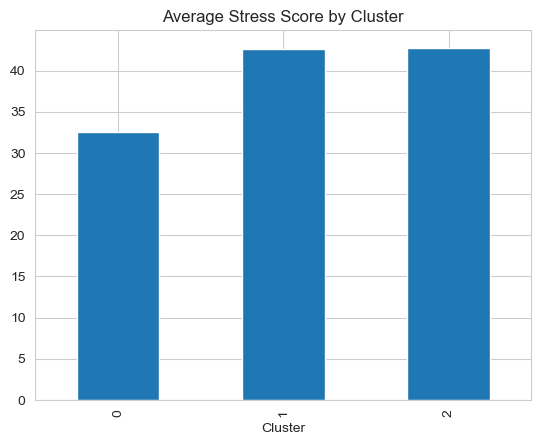

In [ ]:

#Features: Coping mechanisms (Borrowing, Selling_Assets, Reducing_Spending)
X = f_analytics[["Borrowing", "Selling_Assets", "Reducing_Spending" ]]

# Cluster into 3 groups 
kmeans = KMeans(n_clusters=3, random_state=42)
f_analytics["Cluster"] = kmeans.fit_predict(X)

# Analyze cluster characteristics
cluster_summary = f_analytics.groupby("Cluster")[["Borrowing", "Selling_Assets", "Reducing_Spending"]].mean()
print(cluster_summary)

# Compare stress scores across clusters
stress_by_cluster = f_analytics.groupby("Cluster")["Financial_Stress_Score"].mean()
stress_by_cluster.plot(kind="bar", title="Average Stress Score by Cluster");

🔵 Cluster 0 – Borrowers & Mixed Copers
Borrowing: 1.0 (100% rely on loans).
Selling Assets: 0.23 (23% sell assets).
Reducing Spending: 0.49 (49% cut expenses).

Heavy reliance on borrowing, with moderate spending cuts and some asset liquidation.

🔴 Cluster 1 – Non-Copers with Savings
Borrowing: 0.0 (Never borrow).
Selling Assets: 0.19 (19% sell assets).
Reducing Spending: 0.0 (No spending cuts).

Avoids debt and spending cuts, likely relying on savings despite low asset sales.

🟢 Cluster 2 – Spending-Cutters
Borrowing: 0.0 (No loans).
Selling Assets: 0.18 (18% sell assets).
Reducing Spending: 1.0 (100% slash expenses).

Extreme dependence on austerity, with minimal asset sales—potentially unsustainable long-term.



C:\Users\HP\AppData\Local\Temp\ipykernel_14980\1337131724.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Cluster'] = clusters
C:\Users\HP\AppData\Local\Temp\ipykernel_14980\1337131724.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['PC1'] = pca_components[:, 0]
C:\Users\HP\AppData\Local\Temp\ipykernel_14980\1337131724.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

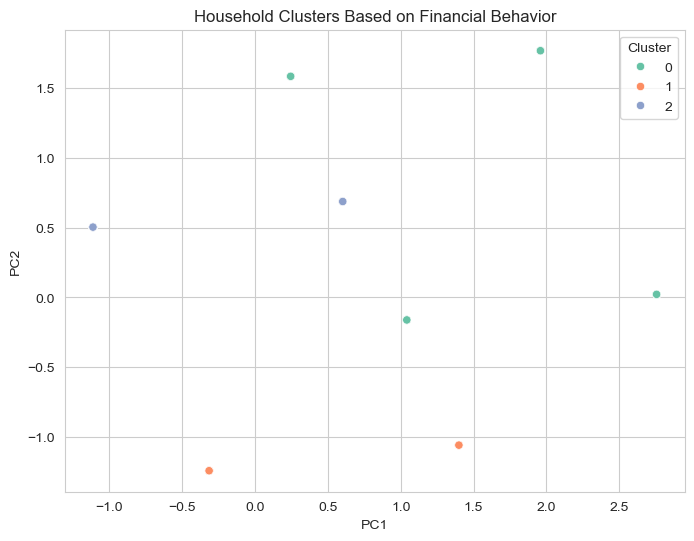

In [105]:
#Features: Coping mechanisms (Borrowing, Selling_Assets, Reducing_Spending)
X = f_analytics[["Borrowing", "Selling_Assets", "Reducing_Spending" ]]
# Normalize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)
X['Cluster'] = clusters

pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_scaled)
X['PC1'] = pca_components[:, 0]
X['PC2'] = pca_components[:, 1]

# Visualize clusters
plt.figure(figsize=(8,6))
sns.scatterplot(data=X, x='PC1', y='PC2', hue='Cluster', palette='Set2')
plt.title("Household Clusters Based on Financial Behavior")
plt.grid(True)
plt.show()

In [106]:
#the mean of each coping feature by cluster
cluster_summary = f_analytics.groupby('Cluster')[["Borrowing", "Selling_Assets", "Reducing_Spending"]].mean()
cluster_summary


,Borrowing,Selling_Assets,Reducing_Spending
Cluster,,,
0,1.0,0.229682,0.491166
1,0.0,0.194070,0.000000
2,0.0,0.179191,1.000000


🔵 Cluster 0 – Borrowers & Mixed Copers
Borrowing: 1.0 (100% rely on loans).
Selling Assets: 0.23 (23% sell assets).
Reducing Spending: 0.49 (49% cut expenses).

Heavy reliance on borrowing, with moderate spending cuts and some asset liquidation.

🔴 Cluster 1 – Non-Copers with Savings
Borrowing: 0.0 (Never borrow).
Selling Assets: 0.19 (19% sell assets).
Reducing Spending: 0.0 (No spending cuts).

Avoids debt and spending cuts, likely relying on savings despite low asset sales.

🟢 Cluster 2 – Spending-Cutters
Borrowing: 0.0 (No loans).
Selling Assets: 0.18 (18% sell assets).
Reducing Spending: 1.0 (100% slash expenses).

Extreme dependence on austerity, with minimal asset sales—potentially unsustainable long-term.

Predictive Modeling

Explaining the code in the next cell


1. Get the data ready:
   - Removes columns we don't need, like household IDs and dates.
   - Keeps useful features like income, expenses, savings access, and coping strategies.

2. Split the data:
   - Divides the data into training data (used to teach the model) and test data (used to check how well it learned).

3. Handle text columns:
   - Converts any text (like "Yes"/"No" or regions) into numbers using One-Hot Encoding so the model can understand them.

4. Build the   model:
   - use linear regression and random forest regressor to build our model

5. Train and test the model:
   - The model learns from the training data and then predicts on the test data.
   - We check how close the predictions are using two metrics:
     - RMSE (Root Mean Squared Error) — smaller is better.
     - R² Score — shows how much of the stress the model can explain (closer to 1 = better).

6. Find what matters most:
   - It shows the top 10 most important features the model used to predict stress (like income, borrowing, savings, etc.).
   - It also shows a nice bar chart of the most influential factors.

In [107]:
#Develop machine learning models to predict financial stress levels based on household income, expense pa􀆩erns, and access to financial products.
#Model training using Linear regression
# Target and features
target = 'Financial_Stress_Score'
features = f_analytics.drop(columns=['Household_ID', 'YearMonth', target], errors='ignore')

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(features, f_analytics[target], test_size=0.2, random_state=42)

# Preprocessing for categorical features
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
preprocessor = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)],
    remainder='passthrough'
)

#pipeline
lr_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train and predict
lr_pipeline.fit(X_train, y_train)
y_pred_lr = lr_pipeline.predict(X_test)

# Evaluation
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"\nLinear Regression Results:")
print(f"RMSE: {rmse_lr:.2f}")
print(f"R² Score: {r2_lr:.2f}")


Linear Regression Results:
RMSE: 4.29
R² Score: 0.64



Top 10 Features (Linear Regression):
                           Feature  Coefficient
76       remainder__Selling_Assets    -7.685060
75            remainder__Borrowing    -4.611039
90              remainder__Cluster     3.556712
77    remainder__Reducing_Spending    -3.458677
13   cat__Education_Level_Tertiary     0.453838
12  cat__Education_Level_Secondary    -0.382693
4              cat__Location_Jinja     0.327120
7             cat__Location_Masaka    -0.298659
73    remainder__Uses_Mobile_Money    -0.287350
72   remainder__Uses_Savings_Group     0.249672


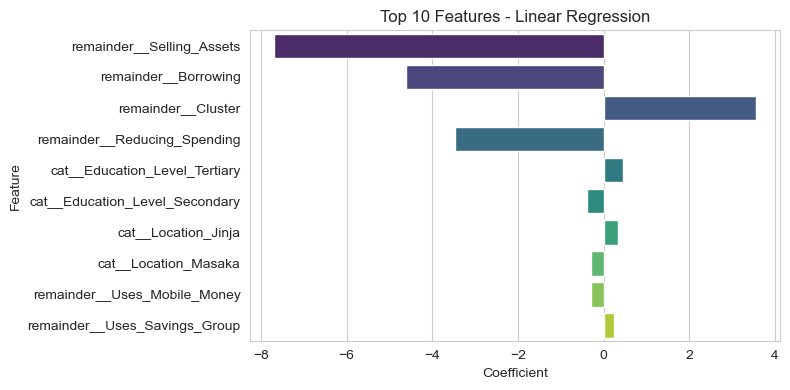

In [108]:
#Feature coefficients
lr_model = lr_pipeline.named_steps['regressor']
feature_names = lr_pipeline.named_steps['preprocessor'].get_feature_names_out()
coefficients = lr_model.coef_

importance_df_lr = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', key=abs, ascending=False)

print("\nTop 10 Features (Linear Regression):")
print(importance_df_lr.head(10))

# Plot
plt.figure(figsize=(8, 4))
sns.barplot(data=importance_df_lr.head(10), x='Coefficient', y='Feature', palette='viridis')
plt.title("Top 10 Features - Linear Regression")
plt.tight_layout()
plt.show()


Features like Total Income, Total Expense, and Income After Expense have the biggest coefficients, meaning they strongly influence the prediction

In [113]:
#Develop machine learning models to predict financial stress levels based on household income, expense pa􀆩erns, and access to financial products.
#Model training using Gradient Boosting
# Target and features
target = 'Financial_Stress_Score'
features = f_analytics.drop(columns=['Household_ID', 'YearMonth', target], errors='ignore')

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(features, f_analytics[target], test_size=0.2, random_state=42)

# Preprocessing for categorical features
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
preprocessor = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)],
    remainder='passthrough'
)

#ipeline
gb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor(n_estimators=200, max_depth=3,min_samples_split=2, min_samples_leaf=3, random_state=42))
])

# Train and predict
gb_pipeline.fit(X_train, y_train)
y_pred_rf = gb_pipeline.predict(X_test)

# Evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Gradient Boosting  Results:")
print(f"RMSE: {rmse_rf:.2f}")
print(f"R² Score: {r2_rf:.2f}")

Gradient Boosting  Results:
RMSE: 3.36
R² Score: 0.78



Top 10 Features (Random Forest):
                           Feature  Importance
75            remainder__Borrowing    0.403196
76       remainder__Selling_Assets    0.306510
90              remainder__Cluster    0.112808
74  remainder__Distance_to_Bank_km    0.099280
86         remainder__Total_Income    0.010651
70          remainder__Family_Size    0.009183
13   cat__Education_Level_Tertiary    0.005603
2               cat__Location_Gulu    0.004661
87        remainder__Total_Expense    0.003370
1        cat__Location_Fort Portal    0.003364


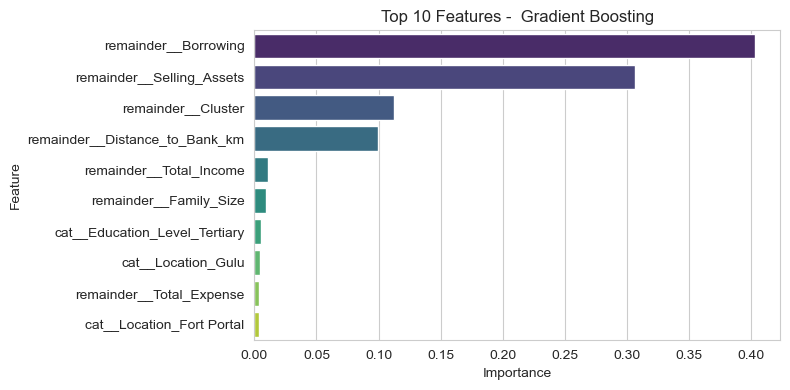

In [114]:
#Feature importances
gb_model = gb_pipeline.named_steps['regressor']
preprocessor = gb_pipeline.named_steps['preprocessor']
feature_names = preprocessor.get_feature_names_out()
importances = gb_model.feature_importances_


importance_df_rf = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nTop 10 Features (Random Forest):")
print(importance_df_rf.head(10))

# Plot feature importances
plt.figure(figsize=(8, 4))
sns.barplot(data=importance_df_rf.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Features -  Gradient Boosting")
plt.tight_layout()
plt.show()

In [ ]:
#Develop machine learning models to predict financial stress levels based on household income, expense pa􀆩erns, and access to financial products.
#Model training using Randomforest
#Define target and features
target = 'Financial_Stress_Score'
X = f_analytics.drop(columns=['Household_ID', 'YearMonth', target], errors='ignore')
y = f_analytics[target]

#Convert categorical variables
X_encoded = pd.get_dummies(X, drop_first=True)  

#Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

#Train the Random Forest model
model = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=10,
    random_state=42
)
model.fit(X_train, y_train)

#Predict and evaluate
y_pred = model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("✅ Random Forest Results:")
print(f"RMSE: {rmse:.2f}")
print(f"R² Score: {r2:.2f}")


✅ Random Forest Results (with get_dummies):
RMSE: 3.07
R² Score: 0.82



🔍 Top 10 Important Features:
                              Feature  Importance
5                           Borrowing    0.462043
6                      Selling_Assets    0.302021
4                 Distance_to_Bank_km    0.066235
20                            Cluster    0.046611
0                         Family_Size    0.017900
16                       Total_Income    0.010352
33  Employment_Type_Livestock Rearing    0.007602
1                 Has_Savings_Account    0.007561
32           Education_Level_Tertiary    0.006005
2                  Uses_Savings_Group    0.005855


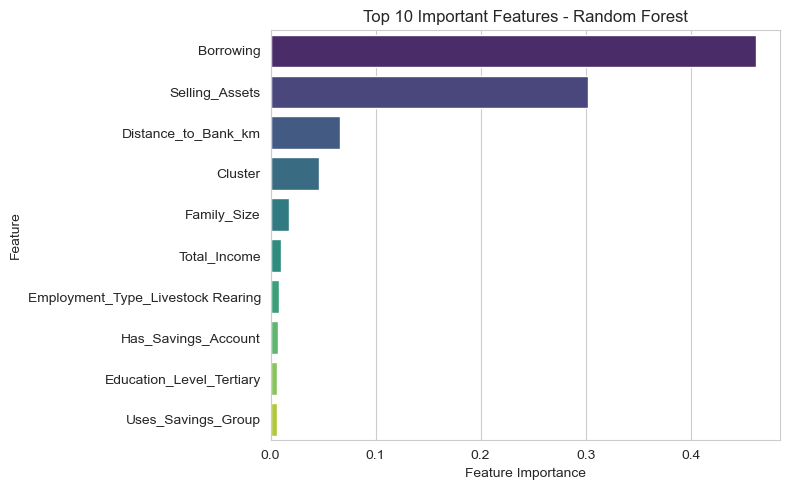

In [117]:
#feature importances
importances = model.feature_importances_

#feature names
feature_names = X_encoded.columns

#Create DataFrame of features and their importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# 4. Show top 10 features
print("\n🔍 Top 10 Important Features:")
print(importance_df.head(10))

plt.figure(figsize=(8, 5))
sns.barplot(data=importance_df.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Important Features - Random Forest")
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [119]:
#Develop machine learning models to predict financial stress levels based on household income, expense pa􀆩erns, and access to financial products.
#Model training using Randomforest
# Target and features
target = 'Financial_Stress_Score'
features = f_analytics.drop(columns=['Household_ID', 'YearMonth', target], errors='ignore')

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(features, f_analytics[target], test_size=0.2, random_state=42)

# Preprocessing for categorical features
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
preprocessor = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)],
    remainder='passthrough'
)

#Pipeline
rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, max_depth=10, min_samples_leaf=10, random_state=42))
])

# Train and predict
rf_pipeline.fit(X_train, y_train)
y_pred_rf = rf_pipeline.predict(X_test)

# Evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"\nRandom Forest Results:")
print(f"RMSE: {rmse_rf:.2f}")
print(f"R² Score: {r2_rf:.2f}")


Random Forest Results:
RMSE: 3.06
R² Score: 0.82


The best performing model is Random Forest Regressor with r2 of 0.82


Top 10 Features (Random Forest):
                                   Feature  Importance
75                    remainder__Borrowing    0.451029
76               remainder__Selling_Assets    0.301635
74          remainder__Distance_to_Bank_km    0.065961
90                      remainder__Cluster    0.056980
70                  remainder__Family_Size    0.016899
86                 remainder__Total_Income    0.010271
15  cat__Employment_Type_Livestock Rearing    0.007362
71          remainder__Has_Savings_Account    0.006996
13           cat__Education_Level_Tertiary    0.005849
72           remainder__Uses_Savings_Group    0.005653


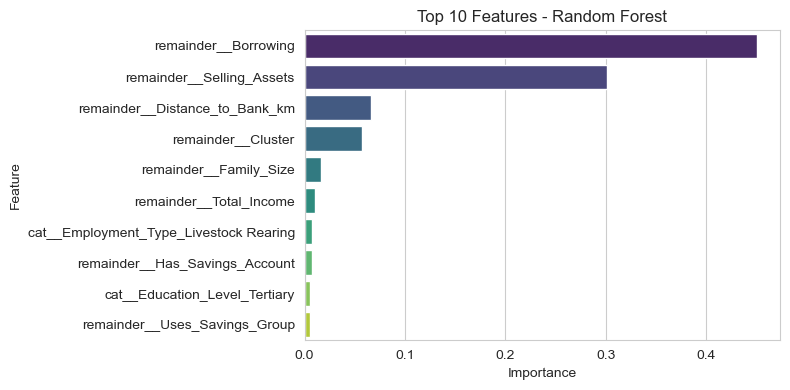

In [120]:
#Feature importances
rf_model = rf_pipeline.named_steps['regressor']
feature_names = rf_pipeline.named_steps['preprocessor'].get_feature_names_out()
importances = rf_model.feature_importances_

importance_df_rf = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nTop 10 Features (Random Forest):")
print(importance_df_rf.head(10))

# Plot feature importances
plt.figure(figsize=(8, 4))
sns.barplot(data=importance_df_rf.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Features - Random Forest")
plt.tight_layout()
plt.show()

This bar chart shows the most important features according to the Random Forest model, which uses many decision trees to make predictions.
The top features are Borrowing, Selling Assets, and Distance to Bank, suggesting financial stress is heavily influenced by how households manage financial emergencies or access services.

Retraining the model using feature importance

In [121]:
top_features = [
    'Borrowing',
    'Selling_Assets',
    'Distance_to_Bank_km',
    'Family_Size',
    'Total_Income',
    'Employment_Type',            
    'Has_Savings_Account',
    'Education_Level',           
    'Uses_Savings_Group'
]


#new dataset with selected features + target
selected_features = f_analytics[top_features]
target = f_analytics['Financial_Stress_Score']

#Convert categorical variables
X_encoded = pd.get_dummies(X, drop_first=True)  

#Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)


best_model = RandomForestRegressor(
        n_estimators=100,
        max_depth=10,
        min_samples_leaf=10,
        random_state=42
    )
# Fit the model
best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"R² Score: {r2:.2f}")



RMSE: 3.07
R² Score: 0.82



🔍 Top 10 Important Features:
                              Feature  Importance
5                           Borrowing    0.462043
6                      Selling_Assets    0.302021
4                 Distance_to_Bank_km    0.066235
20                            Cluster    0.046611
0                         Family_Size    0.017900
16                       Total_Income    0.010352
33  Employment_Type_Livestock Rearing    0.007602
1                 Has_Savings_Account    0.007561
32           Education_Level_Tertiary    0.006005
2                  Uses_Savings_Group    0.005855


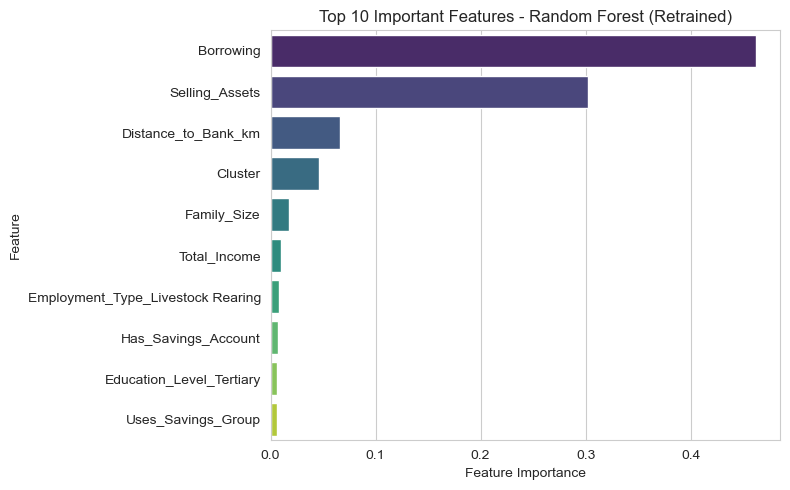

In [123]:
#feature importances
importances = best_model.feature_importances_

#feature names
feature_names = X_encoded.columns

#Create DataFrame of features and their importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# 4. Show top 10 features
print("\n🔍 Top 10 Important Features:")
print(importance_df.head(10))

plt.figure(figsize=(8, 5))
sns.barplot(data=importance_df.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Important Features - Random Forest (Retrained)")
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [124]:
#Saving the model
import joblib
joblib.dump(best_model, "financial_stress_model.pkl")


['financial_stress_model.pkl']